### Import library & Load Data

In [1]:
from util.repo_paths import AMAZON, SILVER_TIKTOK
# 라이브러리 불러오기
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# 텍스트 데이터를 위한 라이브러리
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# 언어 감지 및 번역을 위한 라이브러리: langdetect 간편하게 사용할 수 있어서 선택, 
# Fasttext는 사전 학습된 모델을 다운 받아야 해서 미사용

# 바이그램 및 트리그램을 위한 라이브러리
from nltk.util import ngrams
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from collections import Counter

# 팔레트 색상 테스트를 위한 라이브러리
from matplotlib.colors import LinearSegmentedColormap
from itertools import cycle
import plotly.graph_objects as go
import plotly.io as pio

# 틱톡커 추천을 위한 라이브러리
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

from wordcloud import WordCloud

# LDA 및 토픽 모델링을 위한 라이브러리
import gensim
from gensim.utils import simple_preprocess
# import gensim.corpora as corpora
from gensim import corpora
from pprint import pprint
import pyLDAvis

# 틱톡커 추천을 위한 라이브러리
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import intercluster_distance
from sklearn.metrics import silhouette_score


CWD = os.getcwd()

DATA_PATH = str(AMAZON)
print("현재 경로: ", CWD)

현재 경로:  /Users/jun/GitStudy/Data_4/src/project/project5/final_analysis_code


/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/colors.py:35: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/yellowbrick/style/rcmod.py:31: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  mpl_ge_150 = LooseVersion(mpl.__version__) >= "1.5.0"
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/setuptools/_distutils/version.py:337: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVers

# Tiktok Data

## PART 1: Data Preprocessing

### Load Data

In [ ]:
# TikTok 키워드별 post 데이터 + 인플루언서 데이터 로드.
# load_keyword_dfs() 는 통합 csv를 search_term 값으로 split해 dict로 돌려준다
# (raw 4개 파일은 분실 — data_io.py 참조).
from util.repo_paths import TIKTOK
from util.data_io import load_keyword_dfs

_kw = load_keyword_dfs()
keyword_df, clean_beauty_df, glow_skin_df, kbeauty_skin_care_df, korean_skincare_df = (
    _kw["all"], _kw["clean_beauty"], _kw["glow_skin"], _kw["kbeauty_skin_care"], _kw["korean_skincare"]
)
# 인플루언서 누적 통계 (1월 27일자 dedup된 단일 csv)
tiktoker_df = pd.read_csv(SILVER_TIKTOK / 'tiktokers_silver.csv')


### Data Preprocessing

#### 1. 키워드df 합치기

##### 1-1 : 키워드 df별 중복행 제거

In [ ]:
clean_beauty_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
glow_skin_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
kbeauty_skin_care_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
korean_skincare_df.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)

NameError: name 'clean_beauty_df' is not defined

##### 1-2 : 각 df별 키워드 컬럼 만들어주기
> - 어떤 검색어를 입력하여 추출한 영상인지 알기 위해 검색어 컬럼을 만들어줌

In [ ]:
# clean_beauty_df
for i in range(len(clean_beauty_df)):
    clean_beauty_df.loc[i, 'search_term'] = 'clean_beauty'

# glow_skin_df
for i in range(len(glow_skin_df)):
    glow_skin_df.loc[i, 'search_term'] = 'glow skin'

# kbeauty_skin_care_df
for i in range(len(kbeauty_skin_care_df)):
    kbeauty_skin_care_df.loc[i, 'search_term'] = 'kbeauty skin care'

# korean_skincare_df
for i in range(len(korean_skincare_df)):
    korean_skincare_df.loc[i, 'search_term'] = 'korean skincare'

##### 1-3 : 각 df별 노출 순서 컬럼 만들어주기 
> - 각 검색어를 입력했을 때 영상들이 몇 번째에 떴는지에 대한 컬럼 만들어주기

In [ ]:
# clean_beauty_df
for i in range(len(clean_beauty_df)):
    clean_beauty_df.loc[i, 'vedio_order'] = i + 1

# glow_skin_df
for i in range(len(glow_skin_df)):
    glow_skin_df.loc[i, 'vedio_order'] = i + 1

# kbeauty_skin_care_df
for i in range(len(kbeauty_skin_care_df)):
    kbeauty_skin_care_df.loc[i, 'vedio_order'] = i + 1

# korean_skincare_df
for i in range(len(korean_skincare_df)):
    korean_skincare_df.loc[i, 'vedio_order'] = i + 1

clean_beauty_df['vedio_order'] = clean_beauty_df['vedio_order'].astype(int)
glow_skin_df['vedio_order'] = glow_skin_df['vedio_order'].astype(int)
kbeauty_skin_care_df['vedio_order'] = kbeauty_skin_care_df['vedio_order'].astype(int)
korean_skincare_df['vedio_order'] = korean_skincare_df['vedio_order'].astype(int)

##### 1-5 : df 합치기

In [ ]:
cb_gl_concat = pd.concat([clean_beauty_df,glow_skin_df], axis=0, ignore_index=True)
kbs_ks_concat = pd.concat([kbeauty_skin_care_df,korean_skincare_df], axis=0, ignore_index=True)
keyword_df = pd.concat([cb_gl_concat,kbs_ks_concat], axis=0, ignore_index=True)
keyword_df

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order
0,1563,73,894,morganlkeen,2024-9-5,Replying to @user8022071884889 Non-Toxic Makeu...,clean_beauty,1
1,1337,102,189,therealkatiestone,1-3,#greenscreen new year new diagram #cleansers #...,clean_beauty,2
2,8057,164,5654,kylies.muse,2024-2-1,Replying to @MTMama3 clean makeup options! Som...,clean_beauty,3
3,831,32,432,balancewithani,2024-7-2,I've been looking for a non-toxic beauty brand...,clean_beauty,4
4,5634,104,542,labmuffinbeautyscience,2024-6-22,Clean beauty isn’t making products safer - tha...,clean_beauty,5
...,...,...,...,...,...,...,...,...
778,21.8K,187,6709,4chriisty,2024-6-9,use my yesstyle rewards code CRISPY5 to save m...,korean skincare,193
779,216.3K,381,22.6K,moonskinclub,2023-2-26,✨✨douyin evening skincare routine ✨✨ D: 248154...,korean skincare,194
780,9841,59,2616,koocat,2024-11-18,(non sponsored) a very candid random vid but i...,korean skincare,195
781,881,8,73,ririsglow_,2024-8-26,I’m not leaving the house once my 12 step skin...,korean skincare,196


#### 2. 숫자형, 날짜형 컬럼 전처리
> - view, like, comment, save 컬럼 : 단위(k,m) 변환
> - date
    >> - 25년도 1월 업로드한 경우 2025-01-nn으로 변환 
    >> - nh ago, nd ago, 1w ago인 경우 2025-01-21기준으로 날짜 계산

##### 2-1. date 컬럼 형식 통일 및 datetime으로 변환

In [ ]:
def preprocess_date(df):
    today = datetime(2025, 1, 21)

    for i in range(len(df)):
    
        if len(df['date'][i]) >= 8:
            df.loc[i, 'upload_date'] = df['date'][i]
    
        elif len(df['date'][i]) >= 6:
            date = df['date'][i].replace(' ','')
            alphabet_list = [a for a in date]
    
            if 'h' in alphabet_list:
                df.loc[i, 'upload_date'] = today
    
            elif 'd' in alphabet_list:
                day = alphabet_list[0]
                day = int(day)
                df.loc[i, 'upload_date'] = today - timedelta(days=day)
    
            elif 'w' in alphabet_list:
                week = alphabet_list[0]
                week = int(week)
                df.loc[i, 'upload_date'] = today - timedelta(weeks=week)
    
        elif len(df['date'][i]) == 4:
            df.loc[i, 'upload_date'] = '2025-' + df['date'][i]
    
        elif len(df['date'][i]) == 3:
            df.loc[i, 'upload_date'] = '2025-' + df['date'][i]

    # datetime형으로 변환
    df['upload_date'] = pd.to_datetime(df['upload_date'], format="%Y-%m-%d", errors='coerce')


preprocess_date(keyword_df)
preprocess_date(tiktoker_df)

In [ ]:
# follower 컬럼 단위 전처리 / tiktoker_df만 진행

def process_follower(df):
    for i in range(len(df)):
        follower = df['follower'][i].replace(' ','')
        follower_list = [a for a in follower]
        if 'K' in follower_list:
            num = follower.split('K')[0]
            num = float(num)
            follower_cal = num*1000
            df.loc[i, 'follower_cnt'] = follower_cal
        elif 'M' in follower_list:
            num = follower.split('M')[0]
            num = float(num)
            follower_cal = num*1000000
            df.loc[i, 'follower_cnt'] = follower_cal
        else:
            num = df['follower'][i].replace(' ','')
            follower_cal = float(num)
            df.loc[i, 'follower_cnt'] = follower_cal

process_follower(tiktoker_df)

In [ ]:
# keyword_df 결과 확인 1
keyword_df.tail()

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order,upload_date
778,21.8K,187,6709,4chriisty,2024-6-9,use my yesstyle rewards code CRISPY5 to save m...,korean skincare,193,2024-06-09
779,216.3K,381,22.6K,moonskinclub,2023-2-26,✨✨douyin evening skincare routine ✨✨ D: 248154...,korean skincare,194,2023-02-26
780,9841,59,2616,koocat,2024-11-18,(non sponsored) a very candid random vid but i...,korean skincare,195,2024-11-18
781,881,8,73,ririsglow_,2024-8-26,I’m not leaving the house once my 12 step skin...,korean skincare,196,2024-08-26
782,226.5K,1086,55.5K,amyflamy1,1-11,Cheap skincare routine pt.2 #ILLIYOONpartner #...,korean skincare,197,2025-01-11


In [ ]:
# keyword_df 결과 확인 1
print(keyword_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 783 entries, 0 to 782
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   like           783 non-null    object        
 1   comment        783 non-null    object        
 2   save           783 non-null    object        
 3   tiktoker_name  783 non-null    object        
 4   date           783 non-null    object        
 5   info           782 non-null    object        
 6   search_term    783 non-null    object        
 7   vedio_order    783 non-null    int32         
 8   upload_date    779 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int32(1), object(7)
memory usage: 52.1+ KB
None


In [ ]:
# tiktoker_df 결과 확인 1
tiktoker_df.head(3)

,Unnamed: 0,name,follower,view,like,comment,save,date,info_tag,hash_tag,upload_date,follower_cnt
0,0,mydelicate,399.8K,5158,1334,74,175,14h ago,my favourite blushes and why (with shades)💓 yo...,"['@YesStyle', '@Flower Knows Makeup', '@House ...",2025-01-21,399800.00
1,1,mydelicate,399.8K,24.3K,6606,246,917,3d ago,spend a productive morning with me 💓🎀 why is i...,"['#koreanskincare', '#kbeauty', '#morningrouti...",2025-01-18,399800.00
2,2,mydelicate,399.8K,10.4K,1881,90,218,6d ago,for my girlies who still want to look cute whe...,"['@SHEINUS', '@SHEIN', '#fashion', '#winterclo...",2025-01-15,399800.00


In [ ]:
# tiktoker_df 결과 확인 2
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Unnamed: 0    1680 non-null   int64         
 1   name          1680 non-null   object        
 2   follower      1680 non-null   object        
 3   view          1680 non-null   object        
 4   like          1680 non-null   object        
 5   comment       1680 non-null   int64         
 6   save          1680 non-null   object        
 7   date          1680 non-null   object        
 8   info_tag      1664 non-null   object        
 9   hash_tag      1680 non-null   object        
 10  upload_date   1680 non-null   datetime64[us]
 11  follower_cnt  1680 non-null   float64       
dtypes: datetime64[us](1), float64(1), int64(2), object(8)
memory usage: 157.6+ KB


##### 2-2. view, like, comment, save컬럼 단위 변환

In [ ]:
# view 컬럼 단위 전처리

def process_view(df):
    for i in range(len(df)):
        view = df['view'][i].replace(' ','')
        view_list = [a for a in view]
        if 'K' in view_list:
            num = view.split('K')[0]
            num = float(num)
            view_cal = num*1000
            df.loc[i, 'view_cnt'] = view_cal
        elif 'M' in view_list:
            num = view.split('M')[0]
            num = float(num)
            view_cal = num*1000000
            df.loc[i, 'view_cnt'] = view_cal
        else:
            num = df['view'][i].replace(' ','')
            view_cal = float(num)
            df.loc[i, 'view_cnt'] = view_cal

process_view(tiktoker_df)

In [ ]:
# like 컬럼 단위 전처리

def process_like(df):
    for i in range(len(df)):
        like = df['like'][i].replace(' ','')
        like_list = [a for a in like]
        if 'K' in like_list:
            num = like.split('K')[0]
            num = float(num)
            like_cal = num*1000
            df.loc[i, 'like_cnt'] = like_cal
        elif 'M' in like_list:
            num = like.split('M')[0]
            num = float(num)
            like_cal = num*1000000
            df.loc[i, 'like_cnt'] = like_cal
        else:
            num = df['like'][i].replace(' ','')
            like_cal = float(num)
            df.loc[i, 'like_cnt'] = like_cal

process_like(keyword_df)
process_like(tiktoker_df)

In [ ]:
# comment 컬럼 단위 전처리

def process_comment(df):
    for i in range(len(df)):
        comment = str(df['comment'][i]).replace(' ','')
        comment_list = [a for a in comment]
        if 'K' in comment_list:
            num = comment.split('K')[0]
            num = float(num)
            comment_cal = num*1000
            df.loc[i, 'comment_cnt'] = comment_cal
        elif 'M' in comment_list:
            num = comment.split('M')[0]
            num = float(num)
            comment_cal = num*1000000
            df.loc[i, 'comment_cnt'] = comment_cal
        else:
            num = str(df['comment'][i]).replace(' ','')
            comment_cal = float(num)
            df.loc[i, 'comment_cnt'] = comment_cal

process_comment(keyword_df)
process_comment(tiktoker_df)

In [ ]:
# save 컬럼 단위 전처리

def process_save(df):
    for i in range(len(df)):
        save = df['save'][i].replace(' ','')
        save_list = [a for a in save]
        if 'K' in save_list:
            num = save.split('K')[0]
            num = float(num)
            save_cal = num*1000
            df.loc[i, 'save_cnt'] = save_cal
        elif 'M' in save_list:
            num = save.split('M')[0]
            num = float(num)
            save_cal = num*1000000
            df.loc[i, 'save_cnt'] = save_cal
        else:
            num = df['save'][i].replace(' ','')
            save_cal = float(num)
            df.loc[i, 'save_cnt'] = save_cal

process_save(keyword_df)
process_save(tiktoker_df)

In [ ]:
# like_cnt, comment_cnt, save_cnt컬럼 float에서 int로 변환
keyword_df['like_cnt'] = keyword_df['like_cnt'].round(0).astype(int)
keyword_df['comment_cnt'] = keyword_df['comment_cnt'].round(0).astype(int)
keyword_df['save_cnt'] = keyword_df['save_cnt'].round(0).astype(int)

tiktoker_df['view_cnt'] = tiktoker_df['view_cnt'].round(0).astype(int)
tiktoker_df['like_cnt'] = tiktoker_df['like_cnt'].round(0).astype(int)
tiktoker_df['comment_cnt'] = tiktoker_df['comment_cnt'].round(0).astype(int)
tiktoker_df['save_cnt'] = tiktoker_df['save_cnt'].round(0).astype(int)

In [ ]:
# keyword_df 결과 확인 1
keyword_df.head(5)

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order,upload_date,like_cnt,comment_cnt,save_cnt
0,1563,73,894,morganlkeen,2024-9-5,Replying to @user8022071884889 Non-Toxic Makeu...,clean_beauty,1,2024-09-05,1563,73,894
1,1337,102,189,therealkatiestone,1-3,#greenscreen new year new diagram #cleansers #...,clean_beauty,2,2025-01-03,1337,102,189
2,8057,164,5654,kylies.muse,2024-2-1,Replying to @MTMama3 clean makeup options! Som...,clean_beauty,3,2024-02-01,8057,164,5654
3,831,32,432,balancewithani,2024-7-2,I've been looking for a non-toxic beauty brand...,clean_beauty,4,2024-07-02,831,32,432
4,5634,104,542,labmuffinbeautyscience,2024-6-22,Clean beauty isn’t making products safer - tha...,clean_beauty,5,2024-06-22,5634,104,542


In [ ]:
# keyword_df 결과 확인 2
keyword_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 783 entries, 0 to 782
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   like           783 non-null    object        
 1   comment        783 non-null    object        
 2   save           783 non-null    object        
 3   tiktoker_name  783 non-null    object        
 4   date           783 non-null    object        
 5   info           782 non-null    object        
 6   search_term    783 non-null    object        
 7   vedio_order    783 non-null    int32         
 8   upload_date    779 non-null    datetime64[ns]
 9   like_cnt       783 non-null    int32         
 10  comment_cnt    783 non-null    int32         
 11  save_cnt       783 non-null    int32         
dtypes: datetime64[ns](1), int32(4), object(7)
memory usage: 61.3+ KB


In [ ]:
# tiktoker_df 결과 확인 1
tiktoker_df.head(3)

,Unnamed: 0,name,follower,view,like,comment,save,date,info_tag,hash_tag,upload_date,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt
0,0,mydelicate,399.8K,5158,1334,74,175,14h ago,my favourite blushes and why (with shades)💓 yo...,"['@YesStyle', '@Flower Knows Makeup', '@House ...",2025-01-21,399800.00,5158,1334,74,175
1,1,mydelicate,399.8K,24.3K,6606,246,917,3d ago,spend a productive morning with me 💓🎀 why is i...,"['#koreanskincare', '#kbeauty', '#morningrouti...",2025-01-18,399800.00,24300,6606,246,917
2,2,mydelicate,399.8K,10.4K,1881,90,218,6d ago,for my girlies who still want to look cute whe...,"['@SHEINUS', '@SHEIN', '#fashion', '#winterclo...",2025-01-15,399800.00,10400,1881,90,218


In [ ]:
# tiktoker_df 결과 확인2
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Unnamed: 0    1680 non-null   int64         
 1   name          1680 non-null   object        
 2   follower      1680 non-null   object        
 3   view          1680 non-null   object        
 4   like          1680 non-null   object        
 5   comment       1680 non-null   int64         
 6   save          1680 non-null   object        
 7   date          1680 non-null   object        
 8   info_tag      1664 non-null   object        
 9   hash_tag      1680 non-null   object        
 10  upload_date   1680 non-null   datetime64[us]
 11  follower_cnt  1680 non-null   float64       
 12  view_cnt      1680 non-null   int32         
 13  like_cnt      1680 non-null   int32         
 14  comment_cnt   1680 non-null   int32         
 15  save_cnt      1680 non-null   int32   

#### 3. 해시태그 컬럼 생성
> - 크롤링 한 데이터를 csv파일로 변환하는 과정에서 hash_tag컬럼의 일부 행들이 손상되는 문제 발생
> - info 컬럼에서 해시태그 추출하여 해시태그 컬럼 다시 생성

##### 3-1. info 컬럼에서 해시태그 추출

In [ ]:
tiktoker_df = tiktoker_df.rename(columns={'info_tag': 'info'})

def new_hash_tag_process(df):
    for i in range(len(df)):
        info = str(df['info'][i])
        info_split_list = info.split(' ')
        hash_tag_list = []
        for a in info_split_list:
            if a.startswith('#'):
                hash_tag_list.append(a)
            elif a.startswith('@'):
                hash_tag_list.append(a)
            else:
                pass
        df.loc[i, 'hash_tag'] = ','.join(hash_tag_list)

new_hash_tag_process(keyword_df)
new_hash_tag_process(tiktoker_df)

In [ ]:
# keyword_df 결과 확인 1
keyword_df.head(3)

,like,comment,save,tiktoker_name,date,info,search_term,vedio_order,upload_date,like_cnt,comment_cnt,save_cnt,hash_tag
0,1563,73,894,morganlkeen,2024-9-5,Replying to @user8022071884889 Non-Toxic Makeu...,clean_beauty,1,2024-09-05,1563,73,894,@user8022071884889
1,1337,102,189,therealkatiestone,1-3,#greenscreen new year new diagram #cleansers #...,clean_beauty,2,2025-01-03,1337,102,189,"#greenscreen,#cleansers,#skincare,#beauty,#bea..."
2,8057,164,5654,kylies.muse,2024-2-1,Replying to @MTMama3 clean makeup options! Som...,clean_beauty,3,2024-02-01,8057,164,5654,@MTMama3


In [ ]:
# keyword_df 결과 확인 2
keyword_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 783 entries, 0 to 782
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   like           783 non-null    object        
 1   comment        783 non-null    object        
 2   save           783 non-null    object        
 3   tiktoker_name  783 non-null    object        
 4   date           783 non-null    object        
 5   info           782 non-null    object        
 6   search_term    783 non-null    object        
 7   vedio_order    783 non-null    int32         
 8   upload_date    779 non-null    datetime64[ns]
 9   like_cnt       783 non-null    int32         
 10  comment_cnt    783 non-null    int32         
 11  save_cnt       783 non-null    int32         
 12  hash_tag       783 non-null    object        
dtypes: datetime64[ns](1), int32(4), object(8)
memory usage: 67.4+ KB


In [ ]:
# tiktoker_df 결과 확인 1
tiktoker_df.head(3)

,Unnamed: 0,name,follower,view,like,comment,save,date,info,hash_tag,upload_date,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt
0,0,mydelicate,399.8K,5158,1334,74,175,14h ago,my favourite blushes and why (with shades)💓 yo...,"@YesStyle,@House,#cbeauty,#koreanmakeup,#skinc...",2025-01-21,399800.00,5158,1334,74,175
1,1,mydelicate,399.8K,24.3K,6606,246,917,3d ago,spend a productive morning with me 💓🎀 why is i...,"#kbeauty,#morningroutine,#vlog,#wonyoungism,#s...",2025-01-18,399800.00,24300,6606,246,917
2,2,mydelicate,399.8K,10.4K,1881,90,218,6d ago,for my girlies who still want to look cute whe...,"@SHEINUS,@SHEIN\nuse,#winterclothes,#coquette,...",2025-01-15,399800.00,10400,1881,90,218


In [ ]:
# tiktoker_df 결과 확인2
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Unnamed: 0    1680 non-null   int64         
 1   name          1680 non-null   object        
 2   follower      1680 non-null   object        
 3   view          1680 non-null   object        
 4   like          1680 non-null   object        
 5   comment       1680 non-null   int64         
 6   save          1680 non-null   object        
 7   date          1680 non-null   object        
 8   info          1664 non-null   object        
 9   hash_tag      1680 non-null   object        
 10  upload_date   1680 non-null   datetime64[us]
 11  follower_cnt  1680 non-null   float64       
 12  view_cnt      1680 non-null   int32         
 13  like_cnt      1680 non-null   int32         
 14  comment_cnt   1680 non-null   int32         
 15  save_cnt      1680 non-null   int32   

#### 4. 필요한 컬럼들로 데이터프레임 다시 생성

In [ ]:
keyword_df = keyword_df[['search_term','vedio_order','tiktoker_name', 'upload_date', 'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag']]
tiktoker_df = tiktoker_df[['name', 'follower_cnt', 'info', 'hash_tag', 'upload_date', 'view_cnt', 'like_cnt', 'comment_cnt','save_cnt']]

display(keyword_df.head(3))
display(tiktoker_df.head(3))

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889
1,clean_beauty,2,therealkatiestone,2025-01-03,1337,102,189,#greenscreen new year new diagram #cleansers #...,"#greenscreen,#cleansers,#skincare,#beauty,#bea..."
2,clean_beauty,3,kylies.muse,2024-02-01,8057,164,5654,Replying to @MTMama3 clean makeup options! Som...,@MTMama3


,name,follower_cnt,info,hash_tag,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt
0,mydelicate,399800.00,my favourite blushes and why (with shades)💓 yo...,"@YesStyle,@House,#cbeauty,#koreanmakeup,#skinc...",2025-01-21,5158,1334,74,175
1,mydelicate,399800.00,spend a productive morning with me 💓🎀 why is i...,"#kbeauty,#morningroutine,#vlog,#wonyoungism,#s...",2025-01-18,24300,6606,246,917
2,mydelicate,399800.00,for my girlies who still want to look cute whe...,"@SHEINUS,@SHEIN\nuse,#winterclothes,#coquette,...",2025-01-15,10400,1881,90,218


In [ ]:
# # 데이터 프레임으로 저장
# keyword_df.to_csv('tiktok_post_final_df.csv',index=False, encoding="utf-8-sig")  # 제거 — silver 의 canonical artifact 가 source of truth
# tiktoker_df.to_csv('tiktoker_final_df_0127.csv',index=False, encoding="utf-8-sig")  # 제거 — silver 의 canonical artifact 가 source of truth

#### 5. 자연어 처리

In [2]:
# 처리된 TikTok post 통합본 + 인플루언서 누적 통계 다시 로드.
# 키워드별 split이 필요 없어 통합본만 받아온다 (data_io.py의 load_keyword_dfs 참조).
from util.repo_paths import TIKTOK
from util.data_io import load_keyword_dfs

keyword_df = load_keyword_dfs()["all"]
tiktoker_df = pd.read_csv(SILVER_TIKTOK / 'tiktokers_silver.csv')


In [3]:
import re, string
# porter stemmer 초기화 및 영어 불용어 세트 생성 (캐글 참고)
stemmer = PorterStemmer()
nltk_stopwords = set(stopwords.words('english'))

# 특정 단어들을 불용어 목록에 추가
additional_stopwords = ['clean beauty', 'glow skin', 'kbeauty skin care', 'korean skincare', 'kbeauty', 'product', 'skincare', 'skin', 'beauty',
                        'Kbeauty', 'wonyoungism ', ' wonyoungism', 'wonyoungism', ' wonyoungism ', 'koreanskincare', 'Wonyoungism']
nltk_stopwords.update(additional_stopwords)

# 텍스트 전처리
def clean_text(text):
    if isinstance(text, str):
    
        # 소문자로 모두 변환
        text = text.lower()

        # URL 제거
        text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

        # 마크다운 스타일 링크 제거
        text = re.sub(r'\[.*?\]\(.*?\)', '', text)

        # @ 제거
        text = re.sub(r'@\w+', '', text)

        # 구두점, 특수문자 제거
        text = text.translate(str.maketrans('', '', string.punctuation))

        return text
    else:
        return text

# 텍스트 토큰화
def tokenize_text(text):
    if isinstance(text, str):
        return word_tokenize(text)
    else:
        return text

# 불용어 제거
def remove_stopwords(tokens):
    if isinstance(tokens, list):
        print(f"Tokens: {tokens}")  # 중간 결과 확인
        print(f"Stopwords: {nltk_stopwords}")
        return [token for token in tokens if token not in nltk_stopwords]
    else:
        return tokens

# -> stemming 함수 추가
def stem_tokens(tokens):
    if isinstance(tokens, list):
        return [stemmer.stem(token) for token in tokens]
    else:
        return tokens

In [4]:
# keyword_df 자연어처리 저장
keyword_df['cleaned_info'] = keyword_df['info'].apply(clean_text)
keyword_df['cleaned_hash_tag'] = keyword_df['hash_tag'].apply(clean_text)

keyword_df['tokenized_info'] = keyword_df['cleaned_info'].apply(tokenize_text)
keyword_df['tokenized_hash_tag'] = keyword_df['cleaned_hash_tag'].apply(tokenize_text)

keyword_df['removed_info'] = keyword_df['tokenized_info'].apply(remove_stopwords)
keyword_df['removed_hash_tag'] = keyword_df['tokenized_hash_tag'].apply(remove_stopwords)

keyword_df['stpw_processed_info'] = keyword_df['removed_info'].apply(stem_tokens)
keyword_df['stpw_processed_hash_tag'] = keyword_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['replying', 'to', 'nontoxic', 'makeup', 'blushes', 'powder', 'cream', 'stick', 'cheek', 'stain', 'what', 'clean', 'swaps', 'do', 'you', 'want', 'to', 'see', 'next', 'brands', 'mentioned']
Stopwords: {'at', 'them', 'here', "we've", "i've", 'couldn', 'only', 'Kbeauty', 'he', 'that', 'Wonyoungism', 'beauty', 'you', 'kbeauty skin care', 'than', 'hers', 've', 'm', 'not', 'while', "couldn't", 'above', 'own', 's', 'shan', "hasn't", 'each', 'when', 'korean skincare', 'are', 'now', 'as', 'wasn', "you'll", "shouldn't", 'about', "mightn't", 'this', 'off', "they'd", 'who', 'll', "we're", 'do', 'have', 'being', "isn't", "they're", 'no', "you'd", 'did', 'any', 'hasn', 'in', "it's", 'against', 'didn', "he's", 't', 'clean beauty', 'if', 'product', 'theirs', 'ours', 'how', 'these', 'for', "wasn't", 'your', 'himself', "won't", 'skin', 'over', 'she', 'should', 'into', "she'd", 'out', 'kbeauty', 'mustn', 'yours', "aren't", 'to', ' wonyoungism ', 'an', 'herself', 'between', 'is', 'aren', 'the', 'w

In [5]:
# tiktoker_df 자연어처리 저장
tiktoker_df = tiktoker_df.rename(columns={'info_tag': 'info'})

tiktoker_df['cleaned_info'] = tiktoker_df['info'].apply(clean_text)
tiktoker_df['cleaned_hash_tag'] = tiktoker_df['hash_tag'].apply(clean_text)

tiktoker_df['tokenized_info'] = tiktoker_df['cleaned_info'].apply(tokenize_text)
tiktoker_df['tokenized_hash_tag'] = tiktoker_df['cleaned_hash_tag'].apply(tokenize_text)

tiktoker_df['removed_info'] = tiktoker_df['tokenized_info'].apply(remove_stopwords)
tiktoker_df['removed_hash_tag'] = tiktoker_df['tokenized_hash_tag'].apply(remove_stopwords)

tiktoker_df['stpw_processed_info'] = tiktoker_df['removed_info'].apply(stem_tokens)
tiktoker_df['stpw_processed_hash_tag'] = tiktoker_df['removed_hash_tag'].apply(stem_tokens)

Tokens: ['my', 'favourite', 'blushes', 'and', 'why', 'with', 'shades💓', 'you', 'can', 'find', 'them', 'at', 'using', 'rewards', 'cde', 'mydelicate10', '💓', 'knows', 'makeup', 'of', 'hur', 'kbeauty', 'cbeauty', 'koreanmakeup', 'skincare', 'wonyoungism', 'blush']
Stopwords: {'at', 'them', 'here', "we've", "i've", 'couldn', 'only', 'Kbeauty', 'he', 'that', 'Wonyoungism', 'beauty', 'you', 'kbeauty skin care', 'than', 'hers', 've', 'm', 'not', 'while', "couldn't", 'above', 'own', 's', 'shan', "hasn't", 'each', 'when', 'korean skincare', 'are', 'now', 'as', 'wasn', "you'll", "shouldn't", 'about', "mightn't", 'this', 'off', "they'd", 'who', 'll', "we're", 'do', 'have', 'being', "isn't", "they're", 'no', "you'd", 'did', 'any', 'hasn', 'in', "it's", 'against', 'didn', "he's", 't', 'clean beauty', 'if', 'product', 'theirs', 'ours', 'how', 'these', 'for', "wasn't", 'your', 'himself', "won't", 'skin', 'over', 'she', 'should', 'into', "she'd", 'out', 'kbeauty', 'mustn', 'yours', "aren't", 'to', ' w

## PART 2: EDA & Data Analysis ( + 파생변수 생성)

#### 1. keyword_df

##### 1-1. 워드클라우드

/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


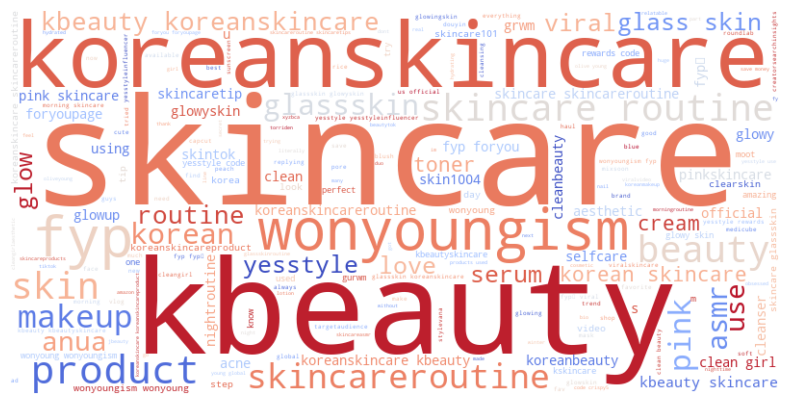

In [6]:
# keyword_df 영상설명 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                      background_color='white', colormap='coolwarm').generate(' '.join(keyword_df['cleaned_info'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Information")
plt.show()

In [7]:
# keyword_df 해시태그 일렬로 정렬
tag_final_list = []
for i in range(len(keyword_df)):
    tags = str(keyword_df['hash_tag'][i])
    tags_list = tags.split(',')
    tag_final_list.append(tags_list)
tag_flat_list = sum(tag_final_list,[])
tag_df = pd.DataFrame({'tag':tag_flat_list})
tag_df

,tag
0,@user8022071884889
1,#greenscreen
2,#cleansers
3,#skincare
4,#beauty
...,...
6563,#koreanskincare
6564,#gurwm
6565,#gurwmroutine
6566,#grwm


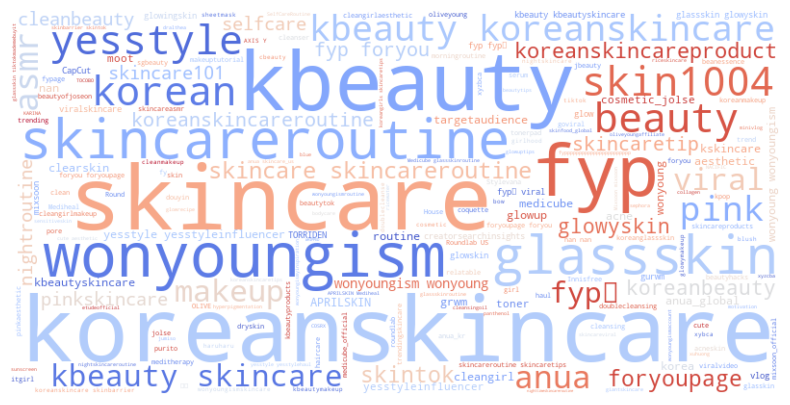

In [8]:
# keyword_df 해시태그 워드클라우드
wordcloud = WordCloud(width=800, height=400, 
                    background_color='white', colormap='coolwarm').generate(' '.join(tag_df['tag'].dropna()))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
# plt.title("Word Cloud - Tiktok Vedio Hash_tag")
plt.show()

##### 1-2. 자주 노출되는 인플루언서
- kbeauty인플루언서들 최신 영상 30개씩 추출할 때 사용 -> tiktoker_df생성
- 편의상 tiktoker_df 전처리도 위에서 진행함

In [9]:
# Float 형식을 일반 숫자 형식으로 변경
pd.options.display.float_format = '{:.2f}'.format

In [10]:
# kbeauty관련 키워드들 입력시 알고리즘에 의해 노출되는 모든 인플루언서들
keyword_df['tiktoker_name'].nunique()

358

In [11]:
# kbeauty관련 키워드들 입력 시 틱톡 알고리즘에 의해 3번 이상 노출된 인풀루우언서들
# 58명 / 358명명 -> tiktoker_df만들 때 사용됨 
tiktoker_cnt = keyword_df['tiktoker_name'].value_counts().reset_index()
tiktoker_cnt[tiktoker_cnt['count'] >= 3]

,tiktoker_name,count
0,mydelicate,37
1,velcroluv,33
2,caspertheghostyy,20
3,bwnniewony,17
4,milkydew,15
5,aeiezo.pdf,15
6,emchu_,14
7,songofskin,13
8,4chriisty,13
9,dearwonii_,11


##### 1-3. 업로드 일자

In [12]:
# upload_date를 20YY-MM 형식으로 변환
def upload_y_m(df):
    df['upload_date_str'] = df['upload_date'].astype(str)
    for i in range(len(df)):
        date = df['upload_date_str'][i]
        y_m = date[:7]
        df.loc[i,'upload_y_m'] = y_m

upload_y_m(keyword_df)

In [13]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()
date_groupby

,upload_y_m,search_term
0,2020-02,1
1,2020-03,2
2,2020-05,2
3,2020-11,1
4,2021-02,1
5,2021-03,1
6,2021-05,1
7,2021-06,1
8,2021-07,2
9,2021-08,2


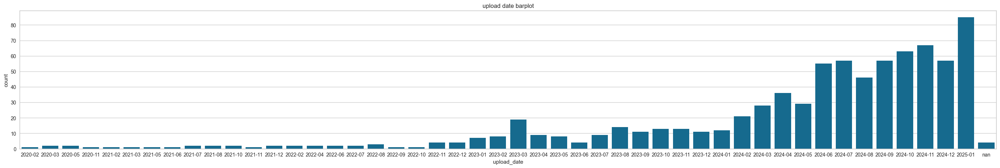

In [14]:
date_groupby = keyword_df.groupby('upload_y_m')['search_term'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='search_term', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

In [15]:
keyword_df.search_term.value_counts()

search_term
clean_beauty         200
kbeauty skin care    199
korean skincare      197
glow skin            187
Name: count, dtype: int64

##### 1-4. 최근 6개월 영상들 k-beauty관련 주요 해시태그

In [16]:
# 1️⃣ 최근 6개월 데이터 필터 + hash_tag - NaN 제거
recent_df = keyword_df[keyword_df['upload_date']>='2024-06-01']
recent_df = recent_df[recent_df['hash_tag'].notna()]
recent_df.head(3)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
1,clean_beauty,2,therealkatiestone,2025-01-03,1337,102,189,#greenscreen new year new diagram #cleansers #...,"#greenscreen,#cleansers,#skincare,#beauty,#bea...",greenscreen new year new diagram cleansers ski...,greenscreencleansersskincarebeautybeautybrandw...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,"[greenscreen, new, year, new, diagram, cleanse...",[greenscreencleansersskincarebeautybeautybrand...,2025-01-03,2025-01
4,clean_beauty,5,labmuffinbeautyscience,2024-06-22,5634,104,542,Clean beauty isn’t making products safer - tha...,#skincarescience,clean beauty isn’t making products safer that...,skincarescience,"[clean, beauty, isn, ’, t, making, products, s...",[skincarescience],"[clean, ’, making, products, safer, ’, problem...",[skincarescience],"[clean, ’, make, product, safer, ’, problem, m...",[skincaresci],2024-06-22,2024-06


In [17]:
# 해시태그만 추출 (# 유지)
def extract_hashtags(text):
    if isinstance(text, str):
        return re.findall(r'#\w+', text)
    return []


recent_df['tag_list'] = recent_df['hash_tag'].apply(extract_hashtags)

# 3️⃣ 리스트 형태를 개별 행으로 변환
tag_df = recent_df.explode('tag_list')[['tag_list']].rename(columns={'tag_list': 'tag'})

# 4️⃣ 공백 제거
tag_df = tag_df[tag_df['tag'].str.strip() != ""]

# 5️⃣ 태그별 등장 횟수 계산
tag_counts = tag_df['tag'].value_counts()

tag_counts


tag
#kbeauty            286
#koreanskincare     253
#skincare           247
#wonyoungism        194
#fyp                134
                   ... 
#kematian             1
#renungan             1
#v11ambassador        1
#mizonambassador      1
#gurwmroutine         1
Name: count, Length: 784, dtype: int64

In [18]:
tag_count =  tag_df["tag"].value_counts().reset_index()
tag_count = tag_count[tag_count['count'] >= 5]
tag_count

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
...,...,...
130,#xybca,5
131,#glassskincare,5
132,#beautyofjoseon,5
133,#skincareviral,5


/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 52628 (\N{HANGUL SYLLABLE CU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


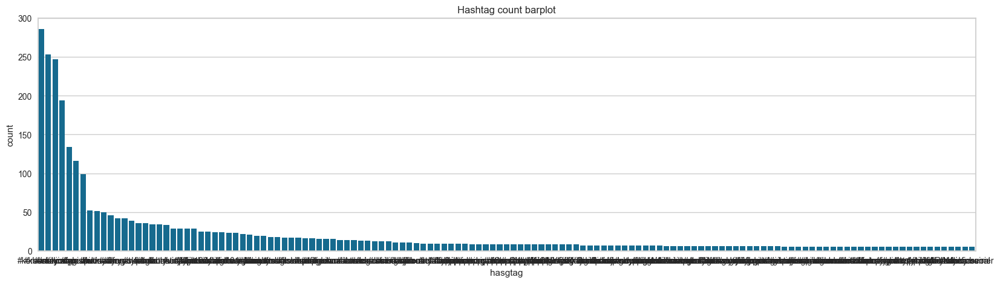

In [19]:
fig, axes = plt.subplots(figsize=(20, 5), sharex=False)
sns.barplot(x='tag', y='count', data=tag_count)
plt.title('Hashtag count barplot')
plt.xlabel('hasgtag')
plt.ylabel('count')
plt.show()

In [20]:
# 최근 6개월 상위 35개 해시태그
tag_count[tag_count['count']>=20]
# skincare, koreanskincare, kbeauty
# skincareroutine, glassskin, 
# glowyskin, viral, skintok, cleanbeauty, skincaretips, asmr, glowup, anua, pink, clearskin

# 우리 회사랑 잘 어울리는 해시태그
# skintok, #ASMR, #skincare

,tag,count
0,#kbeauty,286
1,#koreanskincare,253
2,#skincare,247
3,#wonyoungism,194
4,#fyp,134
5,#skincareroutine,116
6,#glassskin,99
7,#pink,52
8,#korean,51
9,#wonyoung,50


In [21]:
recent_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m', 'tag_list'],
      dtype='object')

In [22]:
recent_df.tag_list

0                                                     []
1      [#greenscreen, #cleansers, #skincare, #beauty,...
4                                     [#skincarescience]
5                                                     []
10                  [#hygiene, #cleangirl, #hygienetips]
                             ...                        
777    [#cleanser, #acneskin, #bumpyskin, #kbeauty, #...
778    [#yslonglasting, #fyp, #kbeauty, #makeup, #kor...
780    [#koreanskincare, #skincarefavorites, #koreans...
781    [#skincare, #kbeauty, #wonyoungism, #koreanski...
782    [#ILLIYOONpartner, #일리윤, #illiyoon, #kbeauty, ...
Name: tag_list, Length: 468, dtype: object

In [23]:
recent_df.hash_tag

0                                     @user8022071884889
1      #greenscreen,#cleansers,#skincare,#beauty,#bea...
4                                       #skincarescience
5                                            @lifebylane
10                      #hygiene,#cleangirl,#hygienetips
                             ...                        
777    @WHIPPED,#cleanser,#acneskin,#bumpyskin,#kbeau...
778    #yslonglasting,#fyp,#kbeauty,#makeup,#korean,#...
780    @SUKOSHI,#koreanskincare,#skincarefavorites,#k...
781    #skincare,#kbeauty,#wonyoungism,#koreanskincar...
782    #ILLIYOONpartner,#일리윤,#illiyoon,#kbeauty,#skin...
Name: hash_tag, Length: 468, dtype: object

In [24]:
recent_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m', 'tag_list'],
      dtype='object')

In [25]:
# 최근 6개월 태그 별 영상 수 및 총 좋아요 수 계산


# 1️영상 id 명시적으로 생성
tag_df = (
    recent_df
    .reset_index()                # index = 영상 id
    .rename(columns={'index': 'video_id'})
    .explode('tag_list')
    .rename(columns={'tag_list': 'tag'})
)

# 빈 태그 제거
tag_df = tag_df[
    tag_df['tag'].notna() &
    tag_df['tag'].str.startswith('#')
]

# 2️⃣ 태그별 집계
tag_count = (
    tag_df
    .groupby('tag')
    .agg(
        count=('tag', 'size'),              # 태그 등장 횟수
        video_cnt=('video_id', 'nunique'),  # ✅ 태그 포함 영상 수
        total_like=('like_cnt', 'sum')      # 영상 좋아요 합
    )
    .reset_index()
    .sort_values('video_cnt', ascending=False)
)

display(tag_count)


,tag,count,video_cnt,total_like
390,#kbeauty,286,282,14577997
420,#koreanskincare,253,249,21892345
613,#skincare,247,247,12822407
735,#wonyoungism,194,191,8664967
269,#fyp,134,134,6266383
...,...,...,...,...
352,#hugeskincare,1,1,111200
351,#howdoyounivea,1,1,26600
348,#homemade,1,1,853600
347,#holygrail,1,1,2097


In [26]:
# 최근 6개월 해시태그별 평균 좋아요수
tag_count['like_mean'] = tag_count['total_like']/tag_count['video_cnt']
tag_count

,tag,count,video_cnt,total_like,like_mean
390,#kbeauty,286,282,14577997,51695.02
420,#koreanskincare,253,249,21892345,87921.06
613,#skincare,247,247,12822407,51912.58
735,#wonyoungism,194,191,8664967,45366.32
269,#fyp,134,134,6266383,46764.05
...,...,...,...,...,...
352,#hugeskincare,1,1,111200,111200.00
351,#howdoyounivea,1,1,26600,26600.00
348,#homemade,1,1,853600,853600.00
347,#holygrail,1,1,2097,2097.00


In [27]:
# 최근 6개월간 해시태그별 영상 수 (Top 5)
# video_cnt 기준 상위 25% threshold 계산
threshold = tag_count['video_cnt'].quantile(0.75)

# 상위 20% 해시태그 추출
top20_usage_tags = (
    tag_count[tag_count['video_cnt'] >= threshold]
    .sort_values('video_cnt', ascending=False)
)

cols = ['tag','video_cnt','total_like','like_mean']

top20_usage_tags[cols]

,tag,video_cnt,total_like,like_mean
390,#kbeauty,282,14577997,51695.02
420,#koreanskincare,249,21892345,87921.06
613,#skincare,247,12822407,51912.58
735,#wonyoungism,191,8664967,45366.32
269,#fyp,134,6266383,46764.05
...,...,...,...,...
675,#tiktokshopfinds,3,20859,6953.00
381,#jellycleanser,3,32700,10900.00
489,#morningcleanser,3,198900,66300.00
398,#kbeautytiktok,3,322078,107359.33


In [28]:
top20_usage_tags[cols].head(20)

,tag,video_cnt,total_like,like_mean
390,#kbeauty,282,14577997,51695.02
420,#koreanskincare,249,21892345,87921.06
613,#skincare,247,12822407,51912.58
735,#wonyoungism,191,8664967,45366.32
269,#fyp,134,6266383,46764.05
627,#skincareroutine,114,9363334,82134.51
292,#glassskin,98,5296599,54046.93
531,#pink,52,2621321,50410.02
406,#korean,51,1754938,34410.55
734,#wonyoung,50,1872888,37457.76


In [29]:
tag_count.columns

Index(['tag', 'count', 'video_cnt', 'total_like', 'like_mean'], dtype='object')

---- 

한국 키워드 들어간 태그와 그렇지 않은 태그들의 평균 좋아요 비율

In [30]:
recent_df.tag_list

0                                                     []
1      [#greenscreen, #cleansers, #skincare, #beauty,...
4                                     [#skincarescience]
5                                                     []
10                  [#hygiene, #cleangirl, #hygienetips]
                             ...                        
777    [#cleanser, #acneskin, #bumpyskin, #kbeauty, #...
778    [#yslonglasting, #fyp, #kbeauty, #makeup, #kor...
780    [#koreanskincare, #skincarefavorites, #koreans...
781    [#skincare, #kbeauty, #wonyoungism, #koreanski...
782    [#ILLIYOONpartner, #일리윤, #illiyoon, #kbeauty, ...
Name: tag_list, Length: 468, dtype: object

In [31]:
# 해시태그별 영상 지표 리스트 생성

import numpy as np
import pandas as pd
from collections import defaultdict

# 해시태그별 지표 집계용
tag_to_metrics = defaultdict(lambda: {'like': [], 'comment': [], 'save': []})

for idx, row in recent_df.iterrows():
    for tag in row['tag_list']:
        tag_to_metrics[tag]['like'].append(row['like_cnt'])
        tag_to_metrics[tag]['comment'].append(row['comment_cnt'])
        tag_to_metrics[tag]['save'].append(row['save_cnt'])

# 데이터프레임으로 변환
tag_metrics_df = pd.DataFrame([
    {
        'tag': tag,
        'like_mean': np.mean(metrics['like']),
        'comment_mean': np.mean(metrics['comment']),
        'save_mean': np.mean(metrics['save']),
        'video_cnt': len(metrics['like'])
    }
    for tag, metrics in tag_to_metrics.items()
])


In [32]:
tag_metrics_df['tag'].value_counts()

tag
#greenscreen              1
#koreanskincareproduct    1
#asmrskincare             1
#wonyoungismaesthetic     1
#skincarehaul             1
                         ..
#뷰티꿀팁                     1
#코덕                       1
#원영이즘                     1
#추천떠라                     1
#gurwmroutine             1
Name: count, Length: 784, dtype: int64

In [33]:
# k_keyword 포함 여부 컬럼 추가
k_keyword = ["kbeauty", "koreanskincare"]
non_k_skincare = ["glassskin", "makeup", "skincareroutine", "skincare","skintok"]

def has_any(keyword_list, tag):
    return any(k in tag for k in keyword_list)

def assign_group(tag):
    if has_any(k_keyword, tag):
        return "k_keyword"
    elif has_any(non_k_skincare, tag):
        return "non_k_skincare_only"
    else:
        return "others"

tag_metrics_df["group"] = tag_metrics_df["tag"].apply(assign_group)

In [34]:
compare_df = tag_metrics_df[
    tag_metrics_df["group"].isin(["k_keyword", "non_k_skincare_only"])
]

In [35]:
# 1️⃣ 그룹별 평균 확인
grouped = compare_df.groupby("group")[["like_mean", "comment_mean", "save_mean"]].mean()

print("그룹별 평균값")
print(grouped)

그룹별 평균값
                     like_mean  comment_mean  save_mean
group                                                  
k_keyword            148428.58       1540.31   39261.99
non_k_skincare_only   96603.45        595.77   13415.67


In [36]:
# 2️⃣ 증가율 계산 (k_keyword vs others)

increase_pct = (
    (grouped.loc["k_keyword"] - grouped.loc["non_k_skincare_only"])
    / grouped.loc["non_k_skincare_only"]
    * 100
).round(2)

print("\nK-beauty 키워드 포함 태그 vs 일반 skincare 태그 평균 증가율(%)")
print(increase_pct)



K-beauty 키워드 포함 태그 vs 일반 skincare 태그 평균 증가율(%)
like_mean       53.65
comment_mean   158.54
save_mean      192.66
dtype: float64


In [37]:
# 3️⃣ 문장 형태로 출력
for metric in ["like_mean", "comment_mean", "save_mean"]:
    pct = increase_pct[metric]
    print(
        f"{metric.replace('_mean','').capitalize()} 기준으로 "
        f"K-beauty 태그가 일반 skincare 태그 대비 {pct}% 높다."
    )


Like 기준으로 K-beauty 태그가 일반 skincare 태그 대비 53.65% 높다.
Comment 기준으로 K-beauty 태그가 일반 skincare 태그 대비 158.54% 높다.
Save 기준으로 K-beauty 태그가 일반 skincare 태그 대비 192.66% 높다.


통계 검정 (독립표본 비교)

In [38]:
#shapiro(group_A)를 사용하면 : 표본 수가 많을수록 거의 항상 기각된다.

# from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu

# def compare_groups(metric):
#     group_A = tag_metrics_df[tag_metrics_df['group']=='k_keyword'][metric]
#     group_B = tag_metrics_df[
#         tag_metrics_df['group'] == 'non_k_skincare_only'
#     ][metric]


#     # 정규성
#     pA = shapiro(group_A)[1]
#     pB = shapiro(group_B)[1]

#     # 등분산성
#     p_levene = levene(group_A, group_B)[1]

#     # 검정 선택
#     if pA > 0.05 and pB > 0.05:
#         if p_levene > 0.05:
#             test, p = ttest_ind(group_A, group_B, equal_var=True)
#             method = f"{metric} 독립표본 t-test(등분산)"
#         else:
#             test, p = ttest_ind(group_A, group_B, equal_var=False)
#             method = f"{metric} Welch t-test(이분산)"
#     else:
#         test, p = mannwhitneyu(group_A, group_B, alternative='two-sided')
#         method = f"{metric} Mann-Whitney U test (비모수)"

#     print(f"{method} → 통계량: {test:.3f}, p-value: {p:.4f}")

# # 좋아요, 댓글, 저장 각각 검정
# for metric in ['like_mean','comment_mean','save_mean']:
#     compare_groups(metric)


| 상황               | 권장           |
| ---------------- | ------------ |
| 표본 수 충분 (n > 30) | Welch t-test |
| 분포 왜곡 심함         | Mann–Whitney |
| 분산 다름            | Welch t-test |

즉, Welch t-test를 기본값으로 두고보조적으로 비모수 검정 확인

In [39]:
from scipy.stats import levene, ttest_ind, mannwhitneyu
import numpy as np

def compare_groups(metric):
    group_A = tag_metrics_df[
        tag_metrics_df['group'] == 'k_keyword'
    ][metric].dropna()

    group_B = tag_metrics_df[
        tag_metrics_df['group'] == 'non_k_skincare_only'
    ][metric].dropna()

    # 등분산성만 확인 (Welch 여부 판단용)
    p_levene = levene(group_A, group_B)[1]

    # Welch t-test (기본)
    t_stat, p_t = ttest_ind(group_A, group_B, equal_var=False)

    # 비모수 검정 (보조 확인)
    u_stat, p_u = mannwhitneyu(group_A, group_B, alternative='two-sided')

    print(f"\n[{metric}]")
    print(f"Welch t-test → t={t_stat:.3f}, p={p_t:.4f}")
    print(f"Mann-Whitney U → U={u_stat:.3f}, p={p_u:.4f}")


for metric in ['like_mean','comment_mean','save_mean']:
    compare_groups(metric)



[like_mean]
Welch t-test → t=1.019, p=0.3180
Mann-Whitney U → U=1076.000, p=0.0298

[comment_mean]
Welch t-test → t=2.666, p=0.0156
Mann-Whitney U → U=1218.000, p=0.0009

[save_mean]
Welch t-test → t=1.684, p=0.1105
Mann-Whitney U → U=1094.000, p=0.0204


### 해석
K-beauty 키워드가 포함된 해시태그는 평균 반응도는 명확히 높다고 말하기 어렵지만,
분포 전체에서는 일반 skincare 태그 대비 유의미하게 우세하다.

1. like_mean (평균 좋아요)

| 검정           | p-value | 해석              |
| ------------ | ------- | --------------- |
| Welch t-test | 0.2861  | 평균 차이 **유의 아님** |
| Mann–Whitney | 0.0249  | 분포 차이 **유의**    |

의미
- 평균은 일부 **초대형 태그(outlier)**에 크게 흔들림
- 그러나 중앙값 이상 비율, 전반적인 분포 위치는 K-beauty 쪽이 우세함.
바이럴 빈도는 더 높다고 해석하는 것이 맞다.



2. comment_mean (평균 댓글)

| 검정           | p-value | 해석               |
| ------------ | ------- | ---------------- |
| Welch t-test | 0.0145  | 평균 차이 **유의**     |
| Mann–Whitney | 0.0007  | 분포 차이 **강하게 유의** |

의미
- 평균도 높고, 분포 전체도 우측 이동
- 가장 강한 효과 지표로 K-beauty 태그는 **참여 유도(engagement depth)**에 명확한 효과를 가지고 있다.

3. save_mean (평균 저장)

| 검정           | p-value | 해석                |
| ------------ | ------- | ----------------- |
| Welch t-test | 0.0999  | 평균 차이 **경계적 비유의** |
| Mann–Whitney | 0.0159  | 분포 차이 **유의**      |


의미
- 일부 고저장 태그가 평균을 끌어내림. 하지만 대다수 태그에서는 저장 반응이 더 높음
- 실용 정보성 콘텐츠 효과를 나타낸다.

왜 이런 패턴이 나오는가? (데이터 구조 관점) 

| 현상         | 원인             |
| ---------- | -------------- |
| t-test 비유의 | 평균이 극단값에 민감    |
| U-test 유의  | 순위 기반 → robust |
| 댓글에서 가장 강함 | 커뮤니티·문화 정체성 반응 |

K-beauty 효과는 “일부 대박”이 아니라 “다수 콘텐츠의 일관된 우위” 형태로 나타난다.

“k-beauty 태그는 평균 반응이 일부 지표에서는 높게 나타났으나,
평균 차이를 일반화할 만큼 일관적이라고 보기는 어렵다.
다만 분포 전반에서는 대부분의 경우 더 높은 반응을 보였다.”

극단적인 바이럴 몇 개가 평균을 끌어올리는 구조가 아니라,
다수 콘텐츠에서 안정적으로 반응이 더 높게 나타난다.”

In [40]:
metrics = ['like_mean', 'comment_mean', 'save_mean']

median_summary = (
    tag_metrics_df
    .groupby('group')[metrics]
    .median()
    .round(2)
)

print("그룹별 지표 중앙값 (Median)")
display(median_summary)

그룹별 지표 중앙값 (Median)


,like_mean,comment_mean,save_mean
group,,,
k_keyword,76000.00,1165.00,13700.00
non_k_skincare_only,29233.33,286.86,5113.00
others,15052.24,170.50,2364.00


좋아요 (Like)
- k_keyword: 76,000
- non_k_skincare_only 대비 2.6배
- others 대비 5.0배

댓글 (Comment)
- k_keyword: 1,165
- non_k_skincare_only 대비 약 4.1배
- others 대비 약 6.5배

저장 (Save)
- k_keyword: 13,700
- non_k_skincare_only 대비 약 2.7배
- others 대비 약 5.7배

K-beauty 키워드를 포함한 콘텐츠는 단순 노출 증가가 아니라,
댓글·저장 등 고관여 지표에서 구조적인 반응성 우위를 보인다.

---

In [41]:
# 1) 영상 수가 적어 의미 없는 평균 제거
Q1 = tag_count["video_cnt"].quantile(0.25)
filtered = tag_count[tag_count["video_cnt"] >= Q1]

# 2) like_mean 기준 상위 20% threshold
threshold = filtered['like_mean'].quantile(0.80)

# 3) filtered 안에서 상위 20% 선택
top20_liked_tags = (
    filtered[filtered['like_mean'] >= threshold]
    .sort_values('like_mean', ascending=False)
)

top20_liked_tags[cols]

,tag,video_cnt,total_like,like_mean
156,#brookemonk,1,3500000,3500000.00
691,#tutorial,1,3500000,3500000.00
517,#oilcleansing,1,2400000,2400000.00
110,#asmrcleaning,1,2000000,2000000.00
190,#cleantok,1,2000000,2000000.00
...,...,...,...,...
692,#tutorialmakeup,1,104600,104600.00
567,#relatable,9,874300,97144.44
387,#jumisopartner,1,96700,96700.00
690,#trueclean,1,96700,96700.00


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3498666097.py:20: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3498666097.py:20: UserWarning: Glyph 52628 (\N{HANGUL SYLLABLE CU}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3498666097.py:20: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3498666097.py:20: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3498666097.py:20: UserWarning: Glyph 53416 (\N{HANGUL SYLLABLE KIN}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3498666097.py:20: UserWarn

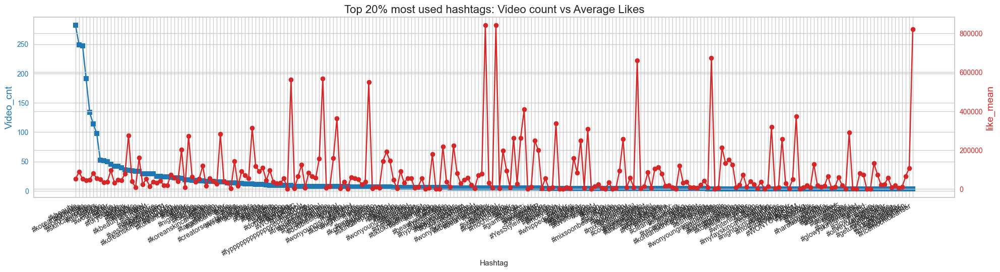

In [42]:
# 최근 6개월 사용량 상위20% 해시태그들의 사용된 영상 개수 대비 평균 좋아요 수

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title('Top 20% most used hashtags: Video count vs Average Likes', fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_usage_tags.tag, top20_usage_tags.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_usage_tags.tag, top20_usage_tags.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1281277588.py:23: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1281277588.py:23: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1281277588.py:23: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1281277588.py:23: UserWarning: Glyph 50980 (\N{HANGUL SYLLABLE YUN}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs

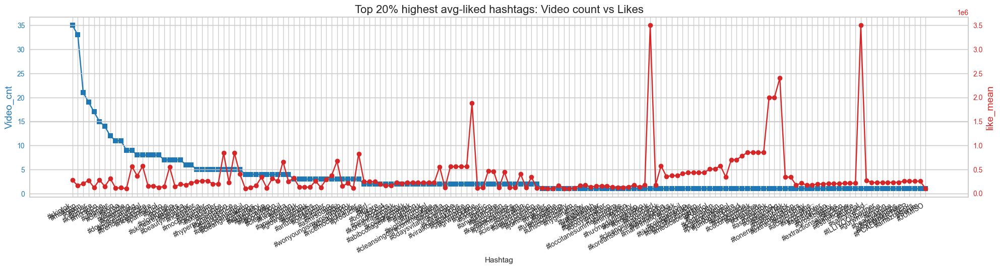

In [43]:
# 최근 6개월 좋아요 평균 상위20% 해시태그들의 사용된 영상 개수 대비 좋아요 수 + 영상 수가 적어 의미 없는 평균 제거됨

# video_cnt 기준 내림차순 정렬
top20_liked_tags_sorted = top20_liked_tags.sort_values('video_cnt', ascending=False).reset_index(drop=True)

# left side : vedio_cnt
fig, ax1 = plt.subplots(figsize=(20, 5), sharex=False)
color_1 = 'tab:blue'
ax1.set_title("Top 20% highest avg-liked hashtags: Video count vs Likes", fontsize=16)
ax1.set_xlabel('Hashtag')
ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
ax1.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.video_cnt, marker='s', color=color_1)
ax1.tick_params(axis='y', labelcolor=color_1)

# right side : like_mean
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color_2 = 'tab:red'
ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
ax2.plot(top20_liked_tags_sorted.tag, top20_liked_tags_sorted.like_mean, marker='o', color=color_2)
ax2.tick_params(axis='y', labelcolor=color_2)

# Rotate x-axis labels by 45 degrees
fig.tight_layout()
plt.xticks(rotation=45)

# To make sure the x-axis labels don't overlap and fit properly
fig.autofmt_xdate()

plt.show()

In [44]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='object')

In [45]:
tiktoker_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag'],
      dtype='object')

# typo 주의
 micro_influancer', 'mega_influancer', 'middle_influancer','mekro_influancer', 'nano_influancer

In [46]:
# 최소 광고비용 컬럼 파생변수 생성
def min_ad_cost_range(df):
    for i in range(len(df)):
        if df['follower_cnt'][i] >= 1000000:
            df.loc[i, 'tiktoker_size'] = 'mega_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000 # 숫자로 설정
        elif df['follower_cnt'][i] >= 500000:
            df.loc[i, 'tiktoker_size'] = 'mekro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 100000:
            df.loc[i, 'tiktoker_size'] = 'middle_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 10000:
            df.loc[i, 'tiktoker_size'] = 'micro_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        elif df['follower_cnt'][i] >= 1000:
            df.loc[i, 'tiktoker_size'] = 'nano_influancer'
            df.loc[i, 'ad_cost'] = df['follower_cnt'][i]*20000
        else:
            df.loc[i, 'tiktoker_size'] = 'under_influancer'
            df.loc[i, 'ad_cost'] = 0 
min_ad_cost_range(tiktoker_df)

In [47]:
tiktoker_df.tiktoker_size.value_counts()

tiktoker_size
middle_influancer    630
micro_influancer     600
mega_influancer      240
nano_influancer      150
mekro_influancer      60
Name: count, dtype: int64

In [48]:
temp_df = (
    keyword_df
    .merge(tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name')
    .drop(columns=['name'])
)

temp_df.tiktoker_size.unique()

array(['micro_influancer', 'mega_influancer', 'middle_influancer',
       'mekro_influancer', 'nano_influancer'], dtype=object)


=== mega_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3177559821.py:66: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3177559821.py:66: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.tight_layout()
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3177559821.py:66: UserWarning: Glyph 50980 (\N{HANGUL SYLLABLE YUN}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51068 (\N{HANGUL SYLLABLE IL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 47532 (\N{HANGUL SYLLABLE RI}) missing from current font.
  fig.canvas.print_figure(bytes_

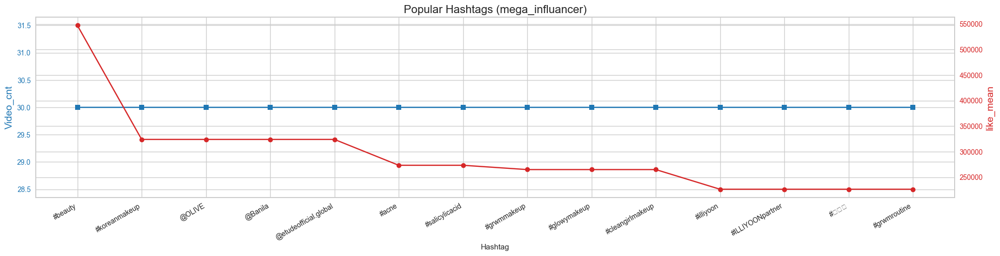


=== mekro_influancer ===


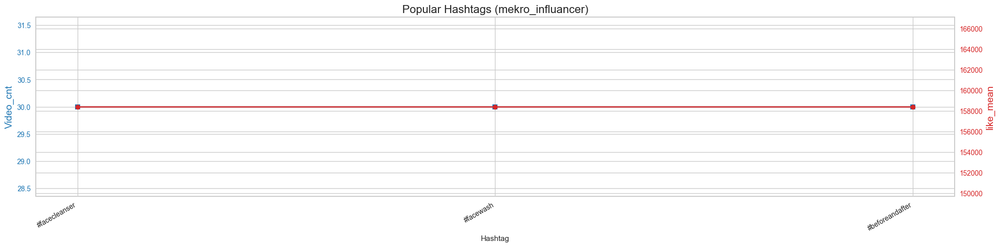


=== middle_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3177559821.py:66: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


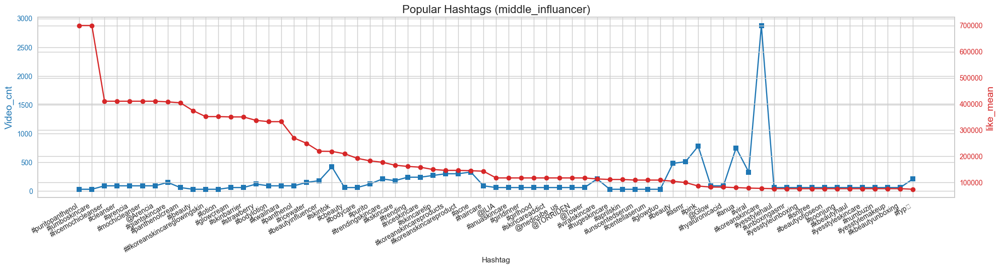


=== micro_influancer ===


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/3177559821.py:66: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.tight_layout()
/opt/homebrew/Caskroom/miniconda/base/envs/leo4study/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 12471 (\N{KATAKANA LETTER SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


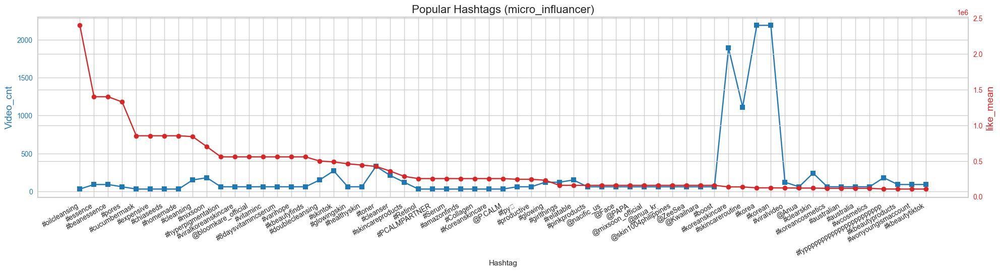


=== nano_influancer ===


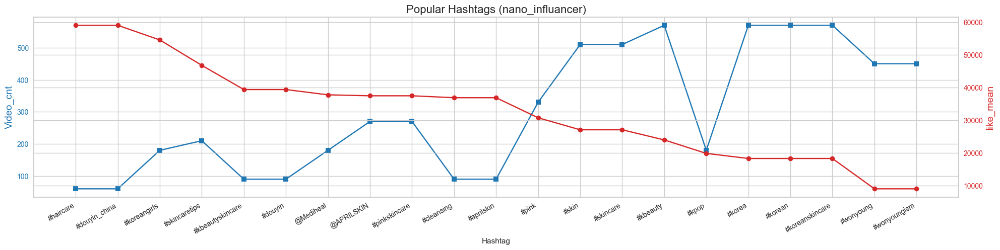

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_hashtags_by_size(keyword_df, tiktoker_df, size, recent_date='2024-06-01', min_tag_count=5, top_percent=0.2):
    """
    단일 인플루언서 사이즈별 해시태그 분석 및 시각화
    """
    # 1) 병합
    temp_df = keyword_df.merge(
        tiktoker_df[['name', 'tiktoker_size']],
        how='inner',
        left_on='tiktoker_name',
        right_on='name'
    ).drop(columns=['name'])
    
    # 2) 사이즈 필터링
    temp_df = temp_df[temp_df['tiktoker_size'] == size].copy()
    
    # 3) 최근 영상 필터링
    recent_df = temp_df[temp_df['upload_date'] >= recent_date].copy()
    recent_df['hash_tag'] = recent_df['hash_tag'].astype(str).fillna('')
    
    # 4) 해시태그 분리
    txt = ",".join(recent_df['hash_tag'])
    tag_df = pd.DataFrame(txt.split(","), columns=['tag'])
    tag_df = tag_df[tag_df['tag'].str.strip() != ""]
    
    # 5) 태그 등장 횟수 필터링
    tag_count = tag_df['tag'].value_counts().reset_index()
    tag_count.columns = ['tag', 'count']
    tag_count = tag_count[tag_count['count'] >= min_tag_count].reset_index(drop=True)
    
    # 6) 영상 수, 총 좋아요 계산
    recent_df['idx'] = recent_df.index
    tag_count['video_cnt'] = 0
    tag_count['total_like'] = 0
    for i in range(len(tag_count)):
        tag = tag_count.loc[i, 'tag']
        matched_videos = recent_df[recent_df['hash_tag'].str.contains(tag, regex=False)].copy()
        tag_count.loc[i, 'video_cnt'] = matched_videos['idx'].nunique()
        tag_count.loc[i, 'total_like'] = matched_videos.groupby('idx')['like_cnt'].first().sum()
    
    # 7) 평균 좋아요
    tag_count['like_mean'] = tag_count['total_like'] / tag_count['video_cnt']
    
    # 8) 상위 n% 태그만 필터링
    n_tags = max(1, int(len(tag_count) * top_percent))
    temp = tag_count.sort_values('like_mean', ascending=False).head(n_tags).reset_index(drop=True)
    
    # 9) 시각화
    fig, ax1 = plt.subplots(figsize=(20,5))
    color_1 = 'tab:blue'
    ax1.set_title(f'Popular Hashtags ({size})', fontsize=16)
    ax1.set_xlabel('Hashtag')
    ax1.set_ylabel('Video_cnt', fontsize=14, color=color_1)
    ax1.plot(temp.tag, temp.video_cnt, marker='s', color=color_1)
    ax1.tick_params(axis='y', labelcolor=color_1)

    ax2 = ax1.twinx()
    color_2 = 'tab:red'
    ax2.set_ylabel('like_mean', fontsize=14, color=color_2)
    ax2.plot(temp.tag, temp.like_mean, marker='o', color=color_2)
    ax2.tick_params(axis='y', labelcolor=color_2)
    
    plt.xticks(rotation=45)
    fig.tight_layout()
    fig.autofmt_xdate()
    plt.show()
    
    return tag_count

# 각 사이즈별 분석 반복
sizes = ['mega_influancer','mekro_influancer',  'middle_influancer', 'micro_influancer','nano_influancer']

size_tag_counts = {}
for sz in sizes:
    print(f"\n=== {sz} ===")
    size_tag_counts[sz] = analyze_hashtags_by_size(
        keyword_df, tiktoker_df, 
        size=sz, recent_date='2024-06-01',
        min_tag_count=5,
        top_percent=0.2
    )


In [50]:
keyword_df.columns

Index(['search_term', 'vedio_order', 'tiktoker_name', 'upload_date',
       'like_cnt', 'comment_cnt', 'save_cnt', 'info', 'hash_tag',
       'cleaned_info', 'cleaned_hash_tag', 'tokenized_info',
       'tokenized_hash_tag', 'removed_info', 'removed_hash_tag',
       'stpw_processed_info', 'stpw_processed_hash_tag', 'upload_date_str',
       'upload_y_m'],
      dtype='object')

#### 2. tiktoker_df

##### 2-1. 인플루언서 사이즈 구분 및 광고 단가 추정치
- 나노 인플루언서 (1,000–10,000 팔로워): 게시물당 $5~$25
- 마이크로 인플루언서 (10,000–100,000 팔로워): 게시물당 $25~$125
- 중간급 인플루언서 (100,000–500,000 팔로워): 게시물당 $125~$1,200
- 매크로 인플루언서 (500,000–1백만 팔로워): 게시물당 $1,200~$2,500
- 메가 인플루언서 (1백만+ 팔로워): 게시물당 $2,500 이상

##### 2-2. 평균 업로드 주기 계산(파생변수 생성)

In [51]:
import pandas as pd
import numpy as np
import re
from datetime import datetime, timedelta

# ✅ 현재 날짜 기준
TODAY = datetime(2025, 1, 27)  # 현재 날짜 설정

# ✅ 'date' 열을 변환하는 함수 (에러 방지 추가)
def parse_date(date_str):
    date_str = str(date_str).strip().lower()  # 공백 제거, 소문자 변환

    # 1️⃣ MM-DD 형식 변환 (예: "1-14" → 2025-01-14)
    match_mmdd = re.fullmatch(r"(\d{1,2})-(\d{1,2})", date_str)
    if match_mmdd:
        month, day = map(int, match_mmdd.groups())  # 월, 일 추출
        return datetime(2025, month, day)  # 2025년으로 변환

    # 2️⃣ 숫자 + 단위(h, d, w) 변환 (예: "14h", "3d", "2w")
    match_relative = re.fullmatch(r"(\d+)([hdw])(?:\s*ago)?", date_str)  # " ago" 처리 추가
    if match_relative:
        num, unit = int(match_relative.group(1)), match_relative.group(2)  # 숫자, 단위 분리
        
        if unit == "h":  # 시간 단위
            return TODAY - timedelta(hours=num)
        elif unit == "d":  # 일 단위
            return TODAY - timedelta(days=num)
        elif unit == "w":  # 주 단위 (1주 = 7일)
            return TODAY - timedelta(weeks=num)

    # 3️⃣ 날짜 형식(YYYY-MM-DD) 변환
    try:
        return pd.to_datetime(date_str)  # YYYY-MM-DD 형식 변환
    except Exception as e:
        print(f"Failed to parse date: {date_str}. Error: {e}")
        return np.nan  # 변환 실패 시 NaT 반환

# ✅ 'date' 열 변환
tiktoker_df["upload_date"] = tiktoker_df["upload_date"].apply(parse_date)

# ✅ name 별로 업로드 간격 계산
tiktoker_df = tiktoker_df.sort_values(by=["name", "upload_date"])  # 이름 + 날짜순 정렬
tiktoker_df["prev_date"] = tiktoker_df.groupby("name")["upload_date"].shift(1)  # 이전 영상 날짜
tiktoker_df["upload_gap"] = (tiktoker_df["upload_date"] - tiktoker_df["prev_date"]).dt.days  # 간격(일)

# ✅ 평균 업로드 주기 계산
upload_cycle = tiktoker_df.groupby("name")["upload_gap"].mean().reset_index()
upload_cycle.rename(columns={"upload_gap": "avg_upload_interval"}, inplace=True)

# ✅ 결과 출력
print(upload_cycle)

                 name  avg_upload_interval
0       .blissdiaries                 4.07
1             .m.egan                 5.03
2            .woniluv                 2.38
3           4chriisty                 2.48
4          __.annie.s                 3.14
5         _luvwonsnnx                 1.48
6          aeiezo.pdf                 3.48
7     ameenbeautytips                 0.17
8           amyflamy1                 1.45
9           asiamelon                 3.34
10           ayheyt3u                 5.76
11         aylennpark                 1.62
12         bwnniewony                 1.93
13   caspertheghostyy                 0.83
14     cleangirlhacks                 3.03
15   cleanlivingkarly                 0.55
16         danicolexx                 0.31
17         dearwonii_                 2.66
18             emchu_                 3.41
19          fromh1ae_                 2.21
20            gae4hrv                 3.59
21     glowupwithinah                 0.24
22         

In [52]:
tiktoker_df[ tiktoker_df.name == "dearwonii_"]

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap
329,dearwonii_,217100.00,2024-11-04,534100,11900,251,2198,Your sign to literally exfoliate! Exfoliating ...,"#tonerpad,#exfoliate,#pores,##skincare,#kbeaut...",your sign to literally exfoliate exfoliating c...,...,"[your, sign, to, literally, exfoliate, exfolia...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, literally, exfoliate, exfoliating, help...",[tonerpadexfoliateporesskincarekbeautybeautyto...,"[sign, liter, exfoli, exfoli, help, remov, pre...",[tonerpadexfoliateporesskincarekbeautybeautyto...,middle_influancer,4342000000.00,NaT,NaN
328,dearwonii_,217100.00,2024-11-07,109300,13400,430,1772,One of my favorite beauty supplements! 2 jars ...,"#beautysupplement,#beauty,#glasskin,#fyp,#fypシ...",one of my favorite beauty supplements 2 jars d...,...,"[one, of, my, favorite, beauty, supplements, 2...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorite, supplements, 2, jars, down🤭sof...",[beautysupplementbeautyglasskinfypfypシtargetau...,"[one, favorit, supplement, 2, jar, down🤭softgl...",[beautysupplementbeautyglasskinfypfypシtargetaudi],middle_influancer,4342000000.00,2024-11-04,3.00
327,dearwonii_,217100.00,2024-11-14,62500,4295,219,522,the cream I only trust with my sensitive skin!...,"@일리윤,#illiyoon,#skincare,#kbeauty,#amazonfinds...",the cream i only trust with my sensitive skin ...,...,"[the, cream, i, only, trust, with, my, sensiti...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensitive, loving, cream, latel...",[illiyoonskincarekbeautyamazonfindssensitivesk...,"[cream, trust, sensit, love, cream, late, real...",[illiyoonskincarekbeautyamazonfindssensitivesk...,middle_influancer,4342000000.00,2024-11-07,7.00
326,dearwonii_,217100.00,2024-11-16,2000000,42300,450,3673,Everything in my skincare that I use in order ...,"#TikTokSuperBrandDay,#skincareroutine,#skin100...",everything in my skincare that i use in order ...,...,"[everything, in, my, skincare, that, i, use, i...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everything, use, order, achieve, glowy, clear...",[tiktoksuperbranddayskincareroutineskin1004kbe...,"[everyth, use, order, achiev, glowi, clear, en...",[tiktoksuperbranddayskincareroutineskin1004kbe...,middle_influancer,4342000000.00,2024-11-14,2.00
325,dearwonii_,217100.00,2024-11-18,58700,4491,178,609,noni fruit is all my skin needs! Definitely my...,"#ampoule,#nonifruit,#skincare,#kbeauty,#beauty...",noni fruit is all my skin needs definitely my ...,...,"[noni, fruit, is, all, my, skin, needs, defini...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, needs, definitely, savior, ampou...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,"[noni, fruit, need, definit, savior, ampoulece...",[ampoulenonifruitskincarekbeautybeautyfypシfypt...,middle_influancer,4342000000.00,2024-11-16,2.00
324,dearwonii_,217100.00,2024-11-21,71800,4434,197,521,If the popular COSRX snail mucin essence didn’...,"#ksecret,#skincare,#kbeauty,#beauty,#fypシ,#fyp...",if the popular cosrx snail mucin essence didn’...,...,"[if, the, popular, cosrx, snail, mucin, essenc...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essence, ’, wor...",[ksecretskincarekbeautybeautyfypシfyptargetaudi...,"[popular, cosrx, snail, mucin, essenc, ’, work...",[ksecretskincarekbeautybeautyfypシfyptargetaudi],middle_influancer,4342000000.00,2024-11-18,3.00
323,dearwonii_,217100.00,2024-11-22,75100,8024,358,918,grwm for a holiday!(winter edition❄️)#grwm #ma...,"#makeup,#winter,#beauty,#beautytok,#fypシ,#fyp,...",grwm for a holidaywinter edition❄️grwm makeup ...,...,"[grwm, for, a, holidaywinter, edition❄️grwm, m...",[makeupwinterbeautybeautytokfypシfyptargetaudie...,"[grwm, holidaywinter, edition❄️grwm, makeup,

In [53]:
# 1차 차분
tiktoker_df["upload_gap_diff"] = tiktoker_df.groupby("name")["upload_gap"].diff()
#그룹별 평균 변화량 한 번에 적용
tiktoker_df["avg_upload_gap_change"] = tiktoker_df.groupby("name")["upload_gap_diff"].transform("mean")


In [54]:
tiktoker_df.groupby('name')['upload_gap'].mean()

name
.blissdiaries        4.07
.m.egan              5.03
.woniluv             2.38
4chriisty            2.48
__.annie.s           3.14
_luvwonsnnx          1.48
aeiezo.pdf           3.48
ameenbeautytips      0.17
amyflamy1            1.45
asiamelon            3.34
ayheyt3u             5.76
aylennpark           1.62
bwnniewony           1.93
caspertheghostyy     0.83
cleangirlhacks       3.03
cleanlivingkarly     0.55
danicolexx           0.31
dearwonii_           2.66
emchu_               3.41
fromh1ae_            2.21
gae4hrv              3.59
glowupwithinah       0.24
haruqhxz             5.62
heartsfor.kbeauty    2.59
its.kaylas           1.31
itsedonna            1.31
izzydiaries          3.38
jaerini              9.14
jasminnlily_         2.24
jeb_bi               1.86
koocat               1.72
krystallee2222       2.24
kwyeona              2.31
lovelymiri05         0.62
luvsfor.jennie       1.21
milkydew             0.52
minseonk1m           0.83
misscasxie           4.48
monakoa

##### 2-3. 업로드 일자 확인

In [55]:
def upload_y_m(df):
    df['upload_date_str'] = df['upload_date'].astype(str)
    for i in range(len(df)):
        date = df['upload_date_str'][i]
        y_m = date[:7]
        df.loc[i,'upload_y_m'] = y_m

upload_y_m(tiktoker_df)

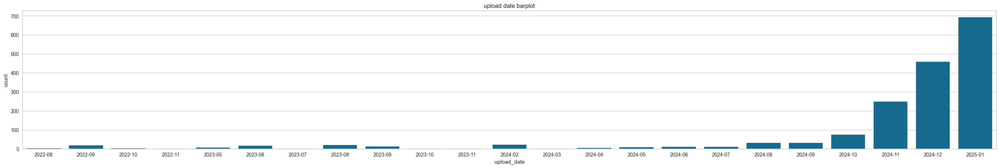

In [56]:
date_groupby = tiktoker_df.groupby('upload_y_m')['name'].count().reset_index()

fig, axes = plt.subplots(figsize=(35, 5), sharex=False)
sns.barplot(x='upload_y_m', y='name', data=date_groupby)
plt.title('upload date barplot')
plt.xlabel('upload_date')
plt.ylabel('count')
plt.show()

##### 2-4. 인플루언서별 정량적 지표 구하기

In [57]:
tiktoker_df.count()

name                       1680
follower_cnt               1680
upload_date                1680
view_cnt                   1680
like_cnt                   1680
comment_cnt                1680
save_cnt                   1680
info                       1664
hash_tag                   1620
cleaned_info               1664
cleaned_hash_tag           1620
tokenized_info             1664
tokenized_hash_tag         1620
removed_info               1664
removed_hash_tag           1620
stpw_processed_info        1664
stpw_processed_hash_tag    1620
tiktoker_size              1680
ad_cost                    1680
prev_date                  1624
upload_gap                 1624
upload_gap_diff            1568
avg_upload_gap_change      1680
upload_date_str            1680
upload_y_m                 1680
dtype: int64

In [58]:
len(tiktoker_df.name.unique())

56

In [59]:
# 인플루언서 선정은 ‘사람(계정)’ 단위로 이루어진다 그러므로 계정 전체의 평균 성과(Mean Engagement)를 보는 것이 자연스럽다

mean_df = tiktoker_df.groupby('name').agg({'follower_cnt':'mean',
                                    'view_cnt':'mean',
                                    'like_cnt':'mean',
                                    'comment_cnt':'mean',
                                    'save_cnt':'mean',
                                    'upload_gap':'mean',
                                    'tiktoker_size': 'max',
                                    'ad_cost':"mean"
                                    }).reset_index()
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [60]:
mean_df.count()

name             56
follower_cnt     56
view_cnt         56
like_cnt         56
comment_cnt      56
save_cnt         56
upload_gap       56
tiktoker_size    56
ad_cost          56
dtype: int64

In [61]:
min_ad_cost_range(mean_df)
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00


In [62]:
# ER 구하기
# ER : ((좋아요 수 + 댓글 수) / 팔로워 수) * 100
mean_df['ER'] = ((mean_df['like_cnt']+mean_df['comment_cnt'])/mean_df['follower_cnt'])*100


# ERV 구하기
# ERV : ((좋아요 수 + 댓글 수 + 저장 수) / 조회수) * 100
mean_df['ERV'] = (mean_df['like_cnt'] + mean_df['comment_cnt'] + mean_df['save_cnt']) / mean_df['view_cnt'] * 100
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,upload_gap,tiktoker_size,ad_cost,ER,ERV
0,.blissdiaries,81700.00,9717.97,1447.33,60.47,196.20,4.07,micro_influancer,1634000000.00,1.85,17.53
1,.m.egan,238200.00,178070.00,23864.30,182.53,3527.30,5.03,middle_influancer,4764000000.00,10.10,15.48
2,.woniluv,135600.00,41956.20,2399.00,85.77,369.93,2.38,middle_influancer,2712000000.00,1.83,6.80


In [63]:
cols = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ER", "ERV"]

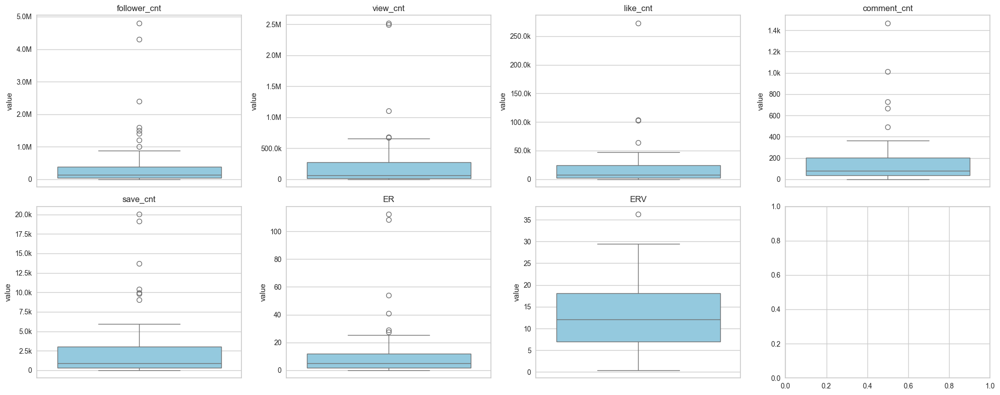

In [64]:
import matplotlib.ticker as mtick

def human_format(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:.1f}M'
    elif x >= 1e3:
        return f'{x*1e-3:.1f}k'
    else:
        return f'{x:.0f}'

formatter = mtick.FuncFormatter(human_format)


fig, axes = plt.subplots(2, 4, figsize=(20, 8))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=mean_df[col], ax=ax, color='skyblue')  # 색상 추가
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()

In [65]:
summary_stats = {}

for col in cols :
    summary_stats[col] = {
    "count": mean_df[col].count(),
    "mean": mean_df[col].mean(),
    "median": mean_df[col].median(),
    "std": mean_df[col].std(),
    "min": mean_df[col].min(),
    "max": mean_df[col].max()
    }

summary_df = pd.DataFrame(summary_stats).T
summary_df


,count,mean,median,std,min,max
follower_cnt,56.00,470629.54,142600.00,924280.71,4121.00,4800000.00
view_cnt,56.00,246204.17,59798.30,489895.19,1690.83,2518470.00
like_cnt,56.00,20198.40,7734.62,41024.61,73.27,272720.00
comment_cnt,56.00,174.63,80.58,260.20,0.50,1466.93
save_cnt,56.00,2836.41,920.40,4444.31,0.67,20036.77
ER,56.00,12.00,5.14,21.73,0.03,112.37
ERV,56.00,13.81,12.10,8.02,0.42,36.27


In [66]:
# 아웃라이어를 IQR 방식으로 확인
outlier_info = {}

for col in cols:
    Q1 = mean_df[col].quantile(0.25)
    Q3 = mean_df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = mean_df[(mean_df[col] < Q1 - 1.5*IQR) | (mean_df[col] > Q3 + 1.5*IQR)]
    outlier_info[col] = {
        "outlier_count": len(outliers),
        "outlier_ratio": len(outliers)/len(mean_df)
    }

outlier_df = pd.DataFrame(outlier_info).T
print(outlier_df)

              outlier_count  outlier_ratio
follower_cnt           8.00           0.14
view_cnt               5.00           0.09
like_cnt               4.00           0.07
comment_cnt            5.00           0.09
save_cnt               7.00           0.12
ER                     6.00           0.11
ERV                    1.00           0.02


In [67]:
def remove_outlier_rows(df, cols):
    filtered_df = df.copy()
    for col in cols:
        Q1 = filtered_df[col].quantile(0.25)
        Q3 = filtered_df[col].quantile(0.75)
        IQR = Q3 - Q1
        # 한 컬럼이라도 아웃라이어면 제거
        filtered_df = filtered_df[(filtered_df[col] >= Q1 - 1.5*IQR) & (filtered_df[col] <= Q3 + 1.5*IQR)]
    return filtered_df

# 적용
filtered_df = remove_outlier_rows(mean_df, cols)

# 요약 통계 계산
summary_stats = {col: {
    "count": filtered_df[col].count(),
    "mean": filtered_df[col].mean(),
    "median": filtered_df[col].median(),
    "std": filtered_df[col].std(),
    "min": filtered_df[col].min(),
    "max": filtered_df[col].max()
} for col in cols}

summary_df = pd.DataFrame(summary_stats).T.round(2)
summary_df

,count,mean,median,std,min,max
follower_cnt,26.00,149388.46,79200.00,157452.04,13700.00,504500.00
view_cnt,26.00,37231.21,22648.40,39445.00,1690.83,157372.27
like_cnt,26.00,3299.07,2389.07,2843.38,73.27,9439.93
comment_cnt,26.00,61.35,46.02,56.00,0.50,222.23
save_cnt,26.00,528.47,377.65,431.11,0.67,1829.90
ER,26.00,3.73,2.12,3.64,0.05,14.39
ERV,26.00,13.75,14.33,7.72,3.62,28.73


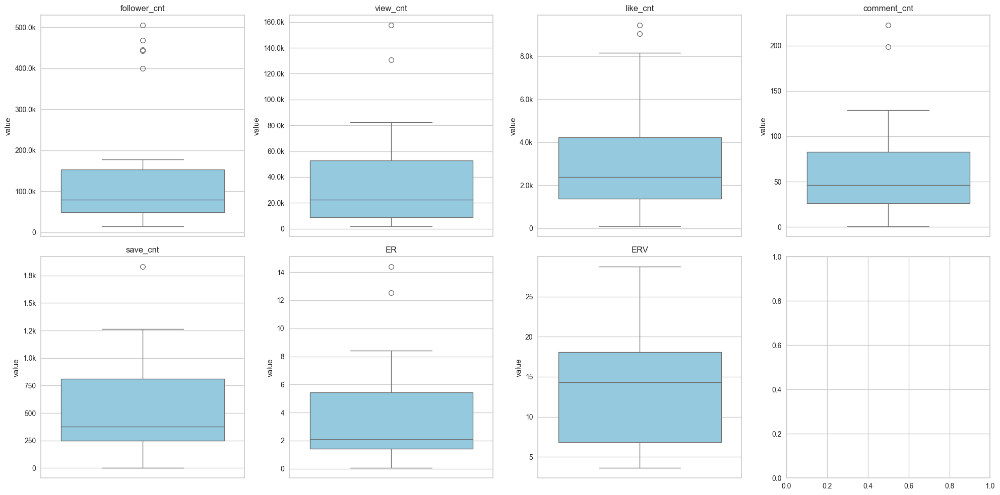

In [68]:
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(y=filtered_df[col], ax=ax, color='skyblue')
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)

plt.tight_layout()
plt.show()


In [69]:
mean_df.tiktoker_size.unique()

array(['micro_influancer', 'middle_influancer', 'mega_influancer',
       'mekro_influancer', 'nano_influancer'], dtype=object)

In [70]:
size_counts = mean_df.groupby('tiktoker_size')[cols[0]].count()  # cols[0] 아무 컬럼 하나 선택해도 됨
size_counts = size_counts.reset_index().rename(columns={cols[0]: 'count'})
print(size_counts)

       tiktoker_size  count
0    mega_influancer      8
1   mekro_influancer      2
2   micro_influancer     20
3  middle_influancer     21
4    nano_influancer      5


In [71]:
cols

['follower_cnt',
 'view_cnt',
 'like_cnt',
 'comment_cnt',
 'save_cnt',
 'ER',
 'ERV']

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/203892770.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will 

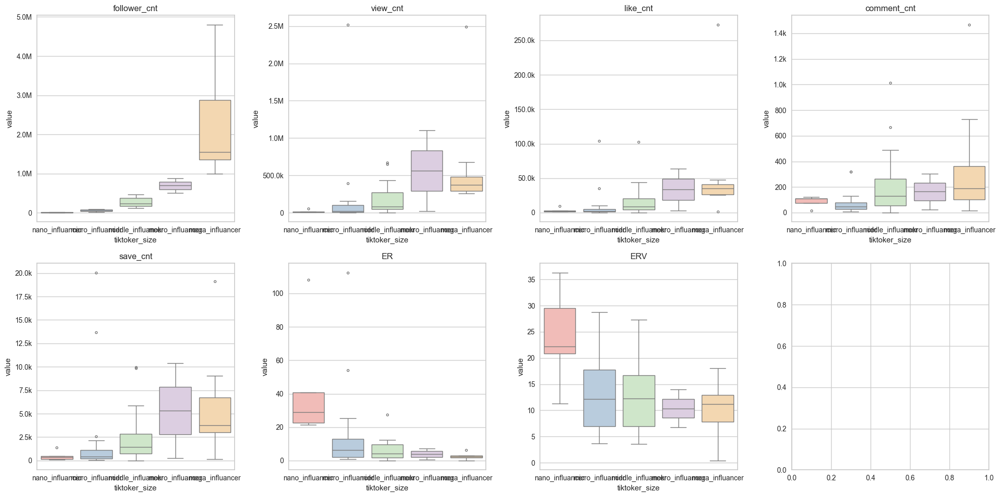

In [72]:
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2,4, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


In [73]:
size_order.reverse()

In [74]:
size_order

['mega_influancer',
 'mekro_influancer',
 'middle_influancer',
 'micro_influancer',
 'nano_influancer']

In [75]:
mean_df.columns

Index(['name', 'follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt',
       'save_cnt', 'upload_gap', 'tiktoker_size', 'ad_cost', 'ER', 'ERV'],
      dtype='object')

✅ 현재 폰트 적용됨: Arial Unicode MS


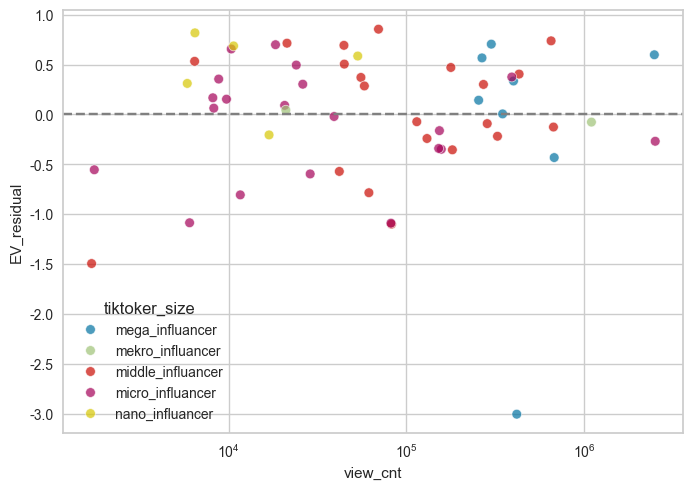

In [76]:
import statsmodels.api as sm
import pltfont
pltfont.auto()

mean_df['EV'] = (
    mean_df['like_cnt']
    + mean_df['comment_cnt']
    + mean_df['save_cnt']
)

X = sm.add_constant(np.log(mean_df['view_cnt']))
y = np.log(mean_df['EV'])

model = sm.OLS(y, X).fit()
mean_df['EV_residual'] = model.resid

sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='EV_residual',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')
plt.axhline(0, color='gray', linestyle='--')

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/2276148532.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


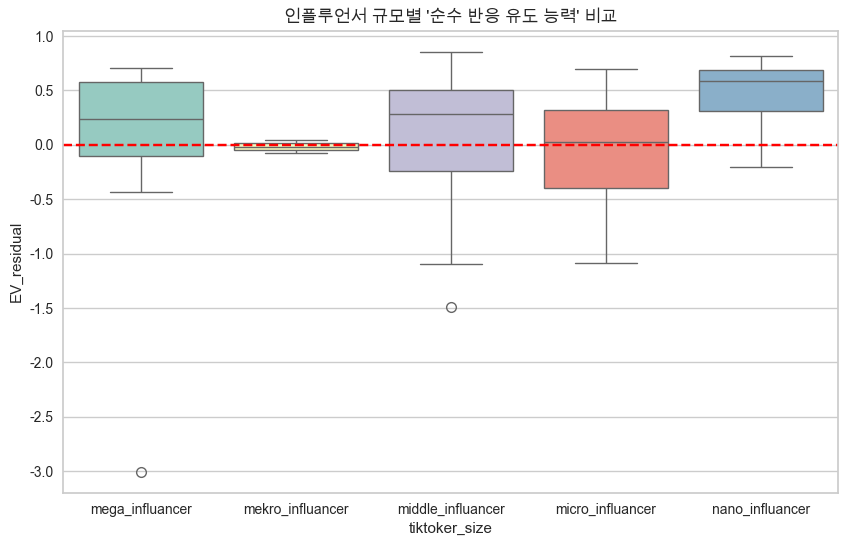

In [77]:
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=mean_df,
    x='tiktoker_size',
    y='EV_residual',
    order=size_order,
    palette='Set3'
)
plt.axhline(0, color='red', linestyle='--')
plt.title("인플루언서 규모별 '순수 반응 유도 능력' 비교")
plt.show()

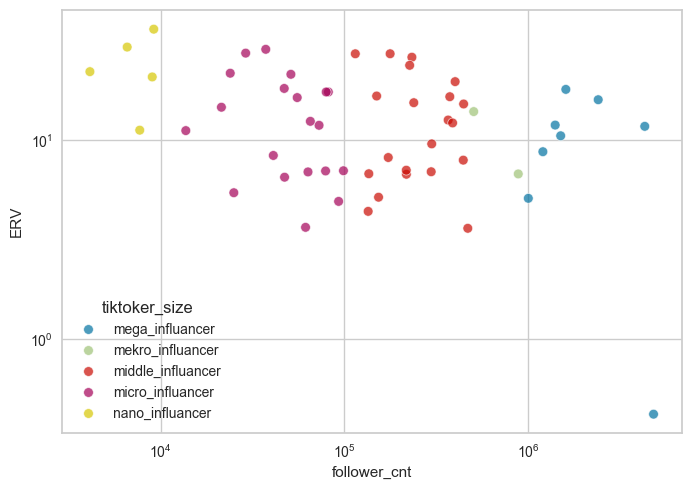

In [78]:
sns.scatterplot(
    data=mean_df,
    x='follower_cnt',
    y='ERV',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

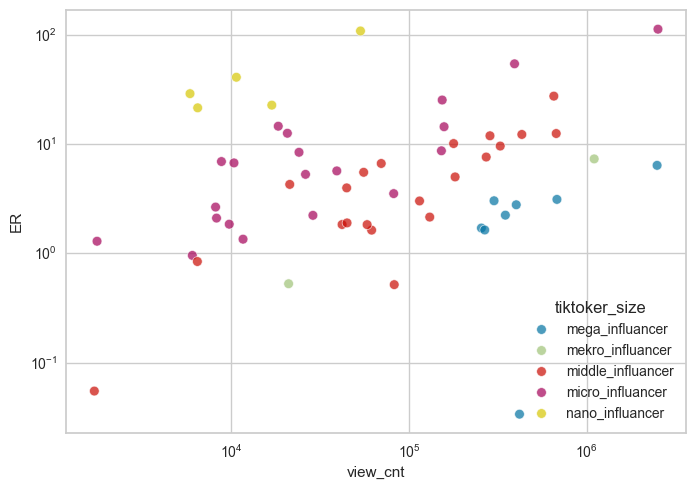

In [79]:
sns.scatterplot(
    data=mean_df,
    x='view_cnt',
    y='ER',
    hue='tiktoker_size',
    alpha=0.7,
    hue_order=size_order
)
plt.xscale('log')  # 규모 차이가 크면 로그 스케일 추천
plt.yscale('log')

---

### 마케팅 비용으로 환산해보자.

In [80]:
tiktoker_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag', 'tiktoker_size', 'ad_cost', 'prev_date',
       'upload_gap', 'upload_gap_diff', 'avg_upload_gap_change',
       'upload_date_str', 'upload_y_m'],
      dtype='object')

In [81]:
k_keyword = ["kbeauty", "koreanskincare"]
non_k_skincare = ["glassskin", "skincareroutine", "skincare", "skintok"]

tmp_df = tiktoker_df.copy()

def group_classifier(x):
    x = str(x).lower()  # 안정성 + 일관성
    if any(k in x for k in k_keyword):
        return "k_keyword"
    elif any(k in x for k in non_k_skincare):
        return "non_k_skincare_only"
    else:
        return "others"

tmp_df["group"] = tmp_df["hash_tag"].apply(group_classifier)


In [82]:
tmp_df["group"].value_counts()

group
k_keyword              809
others                 677
non_k_skincare_only    194
Name: count, dtype: int64

ER / ERV 지표 정의 및 계산

- **ER (Engagement Rate, 팔로워 기반 참여율)**  
  - 정의: 한 콘텐츠의 총 참여 행동(좋아요+댓글+저장)을 팔로워 수로 나눈 비율  
  - 계산 목적: 계정 규모 차이를 보정하여 콘텐츠 반응성을 비교  
  - 해석: 단순히 절대 참여량이 아니라, 계정 규모 대비 상대적 참여 정도를 나타냄
  - 특징: 한 사용자가 여러 행동을 해도 모두 포함 → **총 참여량 기반**  

- **ERV (Engagement Rate by Views, 조회수 기반 참여율)**  
  - 정의: 한 콘텐츠의 총 참여 행동을 조회수로 나눈 비율  
  - 계산 목적: 노출량(view) 차이를 보정하여 실제 콘텐츠 관심도를 평가  
  - 해석: 동일한 조회수 대비 얼마나 많은 참여가 발생했는지를 나타냄  
  - 특징: ER과 달리 조회수 기준, 과도한 노출 시 참여율 감소 가능성 고려  

- **공통 주의점**  
  - ER/ERV는 **총 참여량 대비 비율**이므로, 실제 참여 인원(유니크 사용자 수)과는 다를 수 있음  
  - 퍼센트(%)로 표현하여 회귀 계수와 신뢰구간 해석, 그룹 비교 시 직관성을 높임  


In [83]:
tmp_df['ER'] = (tmp_df['like_cnt'] + tmp_df['comment_cnt'] + tmp_df['save_cnt']) / tmp_df['follower_cnt'] * 100
tmp_df['ERV'] = (tmp_df['like_cnt'] + tmp_df['comment_cnt'] + tmp_df['save_cnt']) / tmp_df['view_cnt'] * 100

In [84]:
# 그룹별 평균 ER, ERV(TikTok용 CTR)
grouped_er = tmp_df.groupby('group')[['like_cnt','comment_cnt','save_cnt','view_cnt','ER','ERV']].mean()
print(grouped_er)

                     like_cnt  comment_cnt  save_cnt  view_cnt    ER   ERV
group                                                                     
k_keyword            13902.67       183.31   2647.38 156276.67 19.00 24.39
non_k_skincare_only  18109.51       116.95   3414.01 372889.01  8.29 13.35
others               28320.25       180.78   2896.79 317362.95 10.07 12.11


✔ Step 1. 정규성 검정 — Shapiro-Wilk
$H_{0}$ : 두 그룹 모두 정규분포를 따른다

✔ Step 2. 등분산 검정 — Levene
$H_{0}$ : 두 그룹의 분산이 동일하다

✔ Step 3. 조건에 따라 적절한 검정 선택
- 두 그룹 모두 정규 + 등분산 → 독립표본 t-test
- 정규 + 이분산 → Welch t-test
- 하나라도 비정규 → Mann-Whitney U test (비모수 검정)

>SNS 반응 데이터는 원래 비정규 → 비모수 검정이 정답</br>
TikTok 지표 분포 특징은:
- 극단값 많음 (heavy-tail)
- long-tail 구조
- zero-inflated(저반응 콘텐츠 다수)
- 해시태그별 편향성 존재

이런 경우:

✔ 정규성을 가정하는 t-test가 더 위험함
✔ Mann–Whitney U test가 더 보수적이고 안정적

In [85]:
from itertools import combinations
from scipy.stats import shapiro, levene, ttest_ind, mannwhitneyu

metrics = ['like_cnt','comment_cnt','save_cnt','follower_cnt','view_cnt','ER','ERV']
groups = ['k_keyword', 'non_k_skincare_only', 'others']

def compare_two_groups(df, metric, g1, g2):
    A = df[df['group'] == g1][metric].dropna()
    B = df[df['group'] == g2][metric].dropna()

    # 표본 수 체크
    if len(A) < 10 or len(B) < 10:
        print(f"{metric} | {g1} vs {g2}: 표본 수 부족")
        return

    # 정규성
    pA = shapiro(A)[1]
    pB = shapiro(B)[1]

    # 등분산
    p_levene = levene(A, B)[1]

    # 테스트 선택
    if pA > 0.05 and pB > 0.05:
        if p_levene > 0.05:
            stat, p = ttest_ind(A, B, equal_var=True)
            method = "t-test (등분산)"
        else:
            stat, p = ttest_ind(A, B, equal_var=False)
            method = "Welch t-test"
    else:
        stat, p = mannwhitneyu(A, B, alternative='two-sided')
        method = "Mann-Whitney U"

    print(f"[{metric}] {g1} vs {g2} | {method} | stat={stat:.3f}, p={p:.4f}")

# 실행
for metric in metrics:
    print(f"\n===== {metric} =====")
    for g1, g2 in combinations(groups, 2):
        compare_two_groups(tmp_df, metric, g1, g2)



===== like_cnt =====
[like_cnt] k_keyword vs non_k_skincare_only | Mann-Whitney U | stat=65481.500, p=0.0003
[like_cnt] k_keyword vs others | Mann-Whitney U | stat=243248.500, p=0.0002
[like_cnt] non_k_skincare_only vs others | Mann-Whitney U | stat=68477.500, p=0.3634

===== comment_cnt =====
[comment_cnt] k_keyword vs non_k_skincare_only | Mann-Whitney U | stat=92136.000, p=0.0002
[comment_cnt] k_keyword vs others | Mann-Whitney U | stat=288688.500, p=0.0716
[comment_cnt] non_k_skincare_only vs others | Mann-Whitney U | stat=58432.500, p=0.0192

===== save_cnt =====
[save_cnt] k_keyword vs non_k_skincare_only | Mann-Whitney U | stat=70036.500, p=0.0199
[save_cnt] k_keyword vs others | Mann-Whitney U | stat=261584.500, p=0.1367
[save_cnt] non_k_skincare_only vs others | Mann-Whitney U | stat=69198.500, p=0.2533

===== follower_cnt =====
[follower_cnt] k_keyword vs non_k_skincare_only | Mann-Whitney U | stat=49319.000, p=0.0000
[follower_cnt] k_keyword vs others | Mann-Whitney U | sta

## 1. 분석 개요

* **대상 데이터**: tiktoker_df

* **분석 대상**:
  최근 6개월 내 스킨케어 관련 영상을 **3개 이상 업로드한 인플루언서 56명**,
  각 인플루언서별 **최신 영상 최대 30개**

* **분석 단위**: 개별 영상(video-level observation)

* **그룹 정의 (3그룹 비교 분석)**

  본 분석은 콘텐츠 해시태그 특성에 따라 인플루언서를 **상호 배타적인 3개 그룹**으로 구분하여 비교한다.

  * **K-beauty 그룹**
    해시태그에 *K-beauty, koreanskincare* 등 K-beauty 스킨케어 정체성을 직접적으로 나타내는 키워드를 포함한 콘텐츠

  * **Generic beauty 그룹**
    스킨케어 관련 콘텐츠이나, K-beauty 정체성 키워드는 포함하지 않은 콘텐츠

  * **Others 그룹**
    스킨케어 맥락이 약하거나, 일반 뷰티 콘텐츠 혹은 기타 콘텐츠

* **분석 지표**:
  like_cnt, comment_cnt, save_cnt, follower_cnt, view_cnt,
  ER (Engagement Rate), ERV (Engagement Rate by View)

* **통계 검정 방법**:
  지표 분포의 비정규성을 확인한 후,
  **3개 그룹 간 분포 차이 검증을 위해 비모수 검정(Kruskal–Wallis test)** 적용
  (필요 시 사후 분석으로 pairwise Mann–Whitney U test 활용)

> **분석 목적**
> 스킨케어 콘텐츠 내에서 **K-beauty 정체성 해시태그 사용 여부 및 유형 차이가 콘텐츠 반응성 분포를 구조적으로 구분하는지**를 3그룹 비교를 통해 검증하는 데 목적이 있다.

---

## 2. 지표별 통계 결과 (3그룹 비교 관점)
표 1. 지표별 3그룹 pairwise Mann–Whitney U test 요약

| 지표           | 비교 쌍              | U 통계량     | p-value | 통계적 해석                                          |
| ------------ | ----------------- | --------- | ------- | ----------------------------------------------- |
| like_cnt     | K vs Generic      | 65,481.5  | 0.0003  | K-beauty 콘텐츠의 좋아요 분포가 Generic beauty 대비 유의하게 높음 |
|              | K vs Others       | 243,248.5 | 0.0002  | K-beauty 콘텐츠가 Others 대비 명확한 우위                  |
|              | Generic vs Others | 68,477.5  | 0.3634  | Generic beauty와 Others 간 유의미한 차이 없음             |
| comment_cnt  | K vs Generic      | 92,136.0  | 0.0002  | K-beauty 키워드가 댓글 참여를 유의하게 증폭                    |
|              | K vs Others       | 288,688.5 | 0.0716  | 경계적 차이, 일관된 우위는 약함                              |
|              | Generic vs Others | 58,432.5  | 0.0192  | Generic beauty가 Others 대비 더 많은 댓글 유도            |
| save_cnt     | K vs Generic      | 70,036.5  | 0.0199  | 약한 차이 존재                                        |
|              | K vs Others       | 261,584.5 | 0.1367  | 유의미한 차이 없음                                      |
|              | Generic vs Others | 69,198.5  | 0.2533  | 저장 행동은 그룹 간 차이가 뚜렷하지 않음                         |
| follower_cnt | K vs Generic      | 49,319.0  | <0.001  | K-beauty 그룹의 계정 규모가 유의하게 큼                      |
|              | K vs Others       | 151,605.5 | <0.001  | 계정 규모 차이 명확                                     |
|              | Generic vs Others | 56,735.0  | 0.0038  | Generic beauty도 Others 대비 규모 큼                  |
| view_cnt     | K vs Generic      | 56,778.5  | <0.001  | K-beauty 콘텐츠가 더 높은 노출 확보                        |
|              | K vs Others       | 213,846.0 | <0.001  | 조회수 분포 차이 뚜렷                                    |
|              | Generic vs Others | 71,563.0  | 0.0564  | 경계적 차이                                          |
| ER           | K vs Generic      | 88,506.5  | 0.0056  | 팔로워 수 보정 후에도 K-beauty 참여율 우위                    |
|              | K vs Others       | 349,913.5 | <0.001  | 참여율 차이 매우 뚜렷                                    |
|              | Generic vs Others | 75,013.5  | 0.0025  | Generic beauty도 Others 대비 참여율 높음                |
| ERV          | K vs Generic      | 107,279.0 | <0.001  | 조회수 보정 후에도 K-beauty 반응성 우위                      |
|              | K vs Others       | 338,764.5 | <0.001  | 노출 효과 통제 후에도 차이 유지                              |
|              | Generic vs Others | 54,246.0  | 0.0002  | Generic beauty가 Others 대비 반응성 높음                |


---

## 3. 종합 해석 (3그룹 구조 기준)

좋아요·댓글·ER·ERV:
- 반응성 지표 전반에서 K-beauty → Generic beauty → Others 순의 명확한 계층 구조가 반복적으로 관측된다.
- 특히 ER과 ERV에서도 동일한 순서가 유지되어, K-beauty 그룹의 우위가 단순한 팔로워 수·조회수 규모 효과가 아니라 동일한 노출·규모 대비 참여율 자체가 높다는 구조적 차이임을 시사한다.
- Generic beauty 그룹 역시 Others 대비 반응성이 높지만, K-beauty 그룹과는 일관된 격차가 존재하여 K-beauty 정체성 키워드가 ‘스킨케어 콘텐츠 여부’를 넘어 추가적인 반응 증폭 효과를 갖는다는 정량적 근거로 해석된다.

저장(save_cnt):
- 세 그룹 간 저장 수 분포에서는 일관된 유의미한 차이가 관측되지 않았다.
- K-beauty 그룹이 저장 반응을 독점하지 않으며, Generic beauty와 Others 간 분포가 상당 부분 중첩된다.
- 이는 저장 행동이 트렌드성 해시태그나 정체성 키워드보다는 콘텐츠의 정보 밀도, 재사용 가능성, 루틴화 가치에 더 크게 영향을 받는 지표임을 시사한다.

조회수(view_cnt):
- 조회수 분포에서도 K-beauty → Generic beauty → Others 순의 차이가 확인된다.
- 이는 K-beauty 콘텐츠가 초기 노출 단계에서부터 알고리즘 상 유리한 위치를 차지할 가능성을 시사하며, 이후 반응성 지표 우위로 이어지는 선행 조건으로 해석 가능하다.

팔로워 수(follower_cnt):
- 세 그룹 간 계정 규모 차이가 통계적으로 확인되며, K-beauty 그룹이 가장 큰 팔로워 규모를 보유한다.
- 따라서 단순 좋아요·댓글 비교는 계정 규모에 의해 왜곡될 수 있으며, ER·ERV와 같은 규모 보정 지표를 활용해야 키워드의 순수 효과를 판단할 수 있음이 명확해진다.
---

## 4. 핵심 결론

본 분석은 스킨케어 콘텐츠를
**K-beauty → Generic beauty → Others**의 **3개 그룹으로 구분했을 때**,
콘텐츠 반응성 분포가 단계적으로 구분됨을 통계적으로 확인하였다.

특히 K-beauty 해시태그를 포함한 콘텐츠는 팔로워 수·조회수 차이를 보정한 이후에도 좋아요·댓글·ER·ERV에서 가장 높은 반응성을 보였다. 이는 K-beauty 키워드가 단순 노출 효과를 넘어 **콘텐츠 참여 구조 자체를 강화하는 신호로 작용할 가능성**을 시사한다.

다만 계정 고정효과, 콘텐츠 유형, 업로드 주기, 영상 포맷을 완전히 통제하지는 않았으므로
인과적 해석에는 한계가 존재한다. 향후에는 패널 회귀, 계정 고정효과 모형, 혹은 콘텐츠 토픽 통제를 포함한 분석으로 확장할 필요가 있다.

---

summary

K-beauty 관련 해시태그를 사용한 콘텐츠는 좋아요·댓글·ER 지표에서 Generic beauty 및 Others 그룹 대비 일관되게 더 높은 반응성을 보였다.
반응성은 K-beauty → Generic beauty → Others 순으로 단계적으로 감소하는 구조를 나타내며, 이는 K-beauty 정체성 키워드가 단순히 ‘스킨케어 콘텐츠 여부’를 넘어 추가적인 반응 증폭 효과를 가짐을 시사한다.

그룹 간 반응성 차이가 계정 규모에 의해 발생했을 가능성을 고려하여, 좋아요·댓글·저장을 팔로워 수로 보정한 ER(Engagement Rate)을 산출해 비교한 결과, **ER 역시 3개 그룹 간 통계적으로 유의한 차이(p < 0.001)**가 유지되었다.
이는 단순히 팔로워 수가 많은 계정이 포함되었기 때문이 아니라, 동일한 팔로워 규모 대비 참여율 자체가 K-beauty 그룹에서 구조적으로 더 높다는 패턴이 존재함을 의미한다.

다만 콘텐츠 유형, 업로드 빈도, 영상 포맷 등 계정 및 콘텐츠 특성을 완전히 통제하지는 않았으므로, 해시태그 사용 자체가 반응성을 증가시킨다고 인과적으로 해석하기에는 한계가 있다.
K-beauty 키워드의 순수 효과를 추정하기 위해서는 계정 특성을 보정한 회귀 모형, 매칭(PSM), 콘텐츠 토픽 고정 효과 등의 추가 분석이 필요하다.

한편 저장 수(save_cnt)는 세 그룹 간 유의한 차이를 보이지 않았다.
이는 저장 행동이 해시태그나 트렌드성 요소보다는 콘텐츠의 정보성, 재사용 가치, 루틴화 가능성에 더 크게 영향을 받는 지표임을 시사한다.

종합적으로 본 분석은 세 그룹의 반응성 분포가 명확히 구분되는 구조를 보인다는 사실을 보여주지만, 이는 상관관계 수준의 결과이다.
해시태그 사용이 반응 증가로 이어진다는 인과적 주장을 위해서는 계정 규모, 콘텐츠 종류, 영상 톤 등을 통제한 확장 분석이 요구된다.

summary

K-beauty 관련 해시태그를 사용한 콘텐츠는 좋아요·댓글·ER 지표에서 통계적으로 유의하게 더 높은 반응성을 보였다.

그룹 간 반응성 차이가 팔로워 규모에 의해 발생했을 가능성을 고려하여, 좋아요·댓글·저장을 팔로워 수로 보정한 ER(Engagement Rate)을 산출해 비교한 결과, ER 역시 매우 유의한 차이(p < 0.001)를 보였다. 이는 단순히 대형 계정이 포함되었기 때문이 아니라, 동일한 팔로워 규모 대비 반응률 자체가 K-beauty 해시태그 콘텐츠에서 구조적으로 더 높다는 것을 의미한다.

다만 콘텐츠 유형, 업로드 빈도, 영상 포맷 등 계정 및 콘텐츠 특성을 완전히 통제하지는 않았으므로, 해시태그 사용이 반응성을 증가시킨다고 인과적으로 해석하기에는 한계가 있다. 순수한 해시태그 효과를 추정하기 위해서는 추가적인 교란 요인 보정이 필요하다.

한편 저장 수는 두 그룹 간 유의한 차이를 보이지 않았다. 이는 저장 행동이 해시태그나 트렌드성 요소보다는 콘텐츠의 정보성, 재활용 가치, 학습 필요성에 더 크게 영향을 받는다는 점을 시사한다.

종합적으로 본 분석은 두 그룹의 반응성 분포가 명확히 다르다는 사실을 보여주지만, 이는 상관관계 수준의 결과이다. 해시태그 사용이 반응 증가로 이어진다는 인과적 주장을 위해서는 계정 규모, 콘텐츠 종류, 영상 톤 등의 요인을 통제한 매칭(PSM), 회귀 모형, 콘텐츠 토픽 고정 효과 등을 포함한 추가 분석이 요구된다.

---

본 분석은 TikTok 내 최근 6개월간 지속적으로 스킨케어 콘텐츠를 업로드한 인플루언서 집단을 대상으로, 동일한 활동 조건 하에서 K-beauty 키워드가 반응 구조에 미치는 차별적 효과를 분석한다


1. k_keyword vs non_k_skincare_only : “K-브랜드 프리미엄 효과”
   - 같은 스킨케어 문맥에서
   - 브랜드 내러티브(K-beauty)가 추가로 주는 효과

2. non_k_skincare_only vs others : “카테고리 효과”
   - 스킨케어라는 관심 주제 자체의 효과

3. k_keyword vs others : “총합 효과 (카테고리 + 브랜드)”

In [86]:
# K-beauty 여부를 0/1로 인코딩
tmp_df['is_k_keyword'] = (tmp_df['group'] == 'k_keyword').astype(int)
tmp_df['is_non_k_skincare'] = (tmp_df['group'] == 'non_k_skincare_only').astype(int)


# 규모 통제 변수
# 로그 변환
tmp_df['log_follower'] = np.log1p(tmp_df['follower_cnt'])
tmp_df['log_view'] = np.log1p(tmp_df['view_cnt'])

| group               | is_k_keyword | is_non_k_skincare |
| ------------------- | ------------ | ----------------- |
| k_keyword           | 1            | 0                 |
| non_k_skincare_only | 0            | 1                 |
| others              | 0            | 0                 |


/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1197614893.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'ERV_coef': [m_erv.params[0], m_erv.params[1], m_erv.params[2], m_erv.params[3]],
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1197614893.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'ER_coef': [m_er.params[0], m_er.params[1], m_er.params[2], m_er.params[3]],


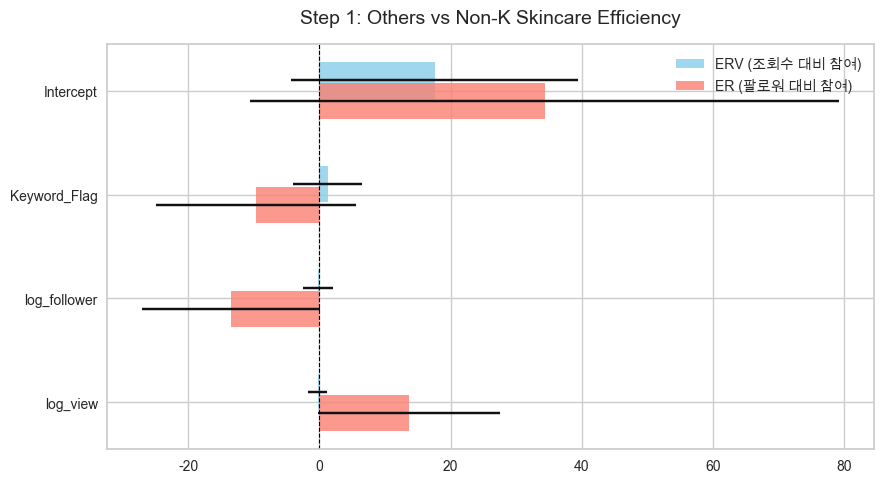

/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1197614893.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'ERV_coef': [m_erv.params[0], m_erv.params[1], m_erv.params[2], m_erv.params[3]],
/var/folders/29/5wmqbm4j3x10qv5vgm_bm8f80000gn/T/ipykernel_80123/1197614893.py:24: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'ER_coef': [m_er.params[0], m_er.params[1], m_er.params[2], m_er.params[3]],


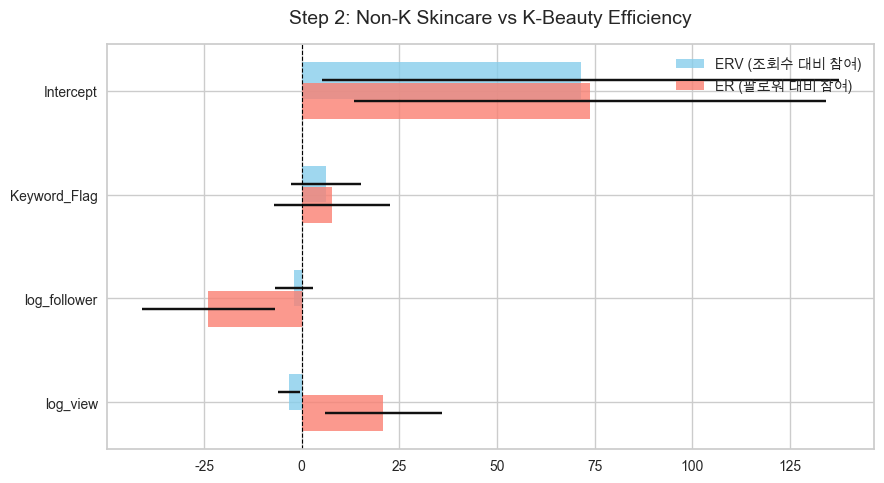

In [87]:
import statsmodels.formula.api as smf

# 공통 설정
variables = ['Intercept', 'Keyword_Flag', 'log_follower', 'log_view']
y_pos = np.arange(len(variables))

height = 0.35  # 총 막대 높이
offset = 0.1   # 그룹 간 간격

def run_and_plot_regression(df, title, keyword_col):
    # 모델 정의 (keyword_col은 각 비교에서 독립변수로 사용될 컬럼명)
    formula_erv = f"ERV ~ {keyword_col} + log_follower + log_view"
    formula_er  = f"ER  ~ {keyword_col} + log_follower + log_view"
    
    m_erv = smf.ols(formula_erv, data=df).fit(cov_type="cluster", cov_kwds={"groups": df["name"]})
    m_er  = smf.ols(formula_er,  data=df).fit(cov_type="cluster", cov_kwds={"groups": df["name"]})
    
    # 데이터 정리
    res = pd.DataFrame({
        'variable': variables,
        'ERV_coef': [m_erv.params[0], m_erv.params[1], m_erv.params[2], m_erv.params[3]],
        'ERV_low': m_erv.conf_int().iloc[:,0].values,
        'ERV_upp': m_erv.conf_int().iloc[:,1].values,
        'ER_coef': [m_er.params[0], m_er.params[1], m_er.params[2], m_er.params[3]],
        'ER_low': m_er.conf_int().iloc[:,0].values,
        'ER_upp': m_er.conf_int().iloc[:,1].values,
    })

    # 시각화
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.barh(y_pos - offset, res['ERV_coef'], xerr=[res['ERV_coef']-res['ERV_low'], res['ERV_upp']-res['ERV_coef']],
            height=height, color='skyblue', label='ERV (조회수 대비 참여)', alpha=0.8)
    ax.barh(y_pos + offset, res['ER_coef'], xerr=[res['ER_coef']-res['ER_low'], res['ER_upp']-res['ER_coef']],
            height=height, color='salmon', label='ER (팔로워 대비 참여)', alpha=0.8)
    
    ax.axvline(0, color='black', linewidth=0.8, linestyle='--')
    ax.set_yticks(y_pos)
    ax.set_yticklabels(variables)
    ax.set_title(title, fontsize=14, pad=15)
    ax.legend()
    ax.invert_yaxis()
    plt.tight_layout()
    plt.show()
    
    return m_erv, m_er

# ---------------------------------------------------------
# 1. Other vs Non-K Skincare (K-beauty 데이터 제외)
# ---------------------------------------------------------
df_step1 = tmp_df[tmp_df['group'].isin(['others', 'non_k_skincare_only'])].copy()
# is_non_k_skincare가 1이면 스킨케어, 0이면 일반
model1_erv, model1_er = run_and_plot_regression(df_step1, "Step 1: Others vs Non-K Skincare Efficiency", "is_non_k_skincare")

# ---------------------------------------------------------
# 2. Non-K Skincare vs K-beauty (일반 'Others' 데이터 제외)
# ---------------------------------------------------------
df_step2 = tmp_df[tmp_df['group'].isin(['non_k_skincare_only', 'k_keyword'])].copy()
# is_k_keyword가 1이면 K-Beauty, 0이면 일반 스킨케어
model2_erv, model2_er = run_and_plot_regression(df_step2, "Step 2: Non-K Skincare vs K-Beauty Efficiency", "is_k_keyword")


In [88]:
# ERV ~ K-beauty + 팔로워 수 + 조회수
model_erv = smf.ols(
    "ERV ~ is_k_keyword + is_non_k_skincare + log_follower + log_view",
    data=tmp_df
).fit(cov_type="cluster", cov_kwds={"groups": tmp_df["name"]})

# 인플루언서 클러스터 보정
# cov_type="cluster", cov_kwds={"groups": tmp_df["name"]}
print(model_erv.summary())

                            OLS Regression Results                            
Dep. Variable:                    ERV   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     2.216
Date:                Fri, 09 Jan 2026   Prob (F-statistic):             0.0791
Time:                        23:31:44   Log-Likelihood:                -9151.4
No. Observations:                1680   AIC:                         1.831e+04
Df Residuals:                    1675   BIC:                         1.834e+04
Df Model:                           4                                         
Covariance Type:              cluster                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            48.3081     21.62

In [89]:
# 회귀계수 비교: β_k_keyword − β_non_k_skincare = 0 ?
# K-beauty 프리미엄 검정 (K-beauty는 그냥 skincare냐, 추가 프리미엄이 있냐)
# K vs non-K skincare
# 둘 다 스킨케어 콘텐츠라는 공통점을 가지지만 K-beauty라는 정체성 키워드가 Generic skincare 대비 추가적인 반응성 상승을 만들어내는가
model_erv.t_test("is_k_keyword = is_non_k_skincare")

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0             8.0321      4.150      1.936      0.053      -0.101      16.165

이 검정은 다음 가설을 직접적으로 테스트한다.

H₀: is_k_keyword = is_non_k_skincare
→ K-beauty 효과 = Generic skincare 효과
→ K-beauty만의 추가 프리미엄은 없다

H₁: is_k_keyword ≠ is_non_k_skincare
→ K-beauty가 일반 스킨케어보다 추가적인 효과를 가진다


coef = 8.0321 → (K-beauty − Generic skincare)의 ERV 차이 추정치

즉, 조회수·팔로워 수를 통제한 상태에서 K-beauty 콘텐츠는 Generic skincare 콘텐츠보다 ERV가 평균적으로 약 8포인트 높다는 추정 결과다.

이 방향성 자체는 K-beauty 프리미엄이 존재할 가능성을 시사한다.

하지만 통계적 유의성은 따로 봐야 한다.

t = 1.753
p-value = 0.080

- 일반적인 기준(p < 0.05)에서는 유의하지 않음
- 다만 p < 0.10 기준에서는 경계적으로 유의(marginally significant)

즉, “K-beauty가 Generic skincare보다 더 반응성이 높을 가능성은 관측되지만, 표본 변동성을 고려할 때 이를 강하게 단정할 수 있을 정도로 충분히 안정적이지는 않다” 라고 해석하는 것이 정확하다.

신뢰구간을 보면 더 명확해진다. 95% CI: [-0.955, 17.019] 
- 0을 포함 → 차이가 없을 가능성도 통계적으로 배제할 수 없음. 
- 동시에 상한은 꽤 큼 → 잠재적 프리미엄의 크기는 작지 않을 수도 있음

이건 “효과가 없다고 결론 내릴 상황”이 아니라 **“효과는 있어 보이지만 표본·분산 때문에 확신도가 부족한 상태”**다.


“K-beauty 콘텐츠는 Generic skincare 콘텐츠 대비 ERV가 더 높은 경향을 보였으나,
해당 차이는 5% 유의수준에서는 통계적으로 유의하지 않았으며(p = 0.08),
K-beauty만의 추가 프리미엄 존재 여부는 제한적인 증거 수준에 머문다.”


In [90]:
# ER ~ K-beauty + 팔로워 수 + 조회수
model_er = smf.ols(
    "ER ~ is_k_keyword + is_non_k_skincare + log_follower + log_view",
    data=tmp_df
).fit(cov_type="cluster", cov_kwds={"groups": tmp_df["name"]})

print(model_er.summary())

                            OLS Regression Results                            
Dep. Variable:                     ER   R-squared:                       0.134
Model:                            OLS   Adj. R-squared:                  0.132
Method:                 Least Squares   F-statistic:                     2.686
Date:                Fri, 09 Jan 2026   Prob (F-statistic):             0.0406
Time:                        23:31:45   Log-Likelihood:                -9745.1
No. Observations:                1680   AIC:                         1.950e+04
Df Residuals:                    1675   BIC:                         1.953e+04
Df Model:                           4                                         
Covariance Type:              cluster                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            62.0203     24.14

In [91]:
# K vs non-K skincare (ER 기준)
model_er.t_test("is_k_keyword = is_non_k_skincare")

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0             9.5720      7.308      1.310      0.190      -4.751      23.895

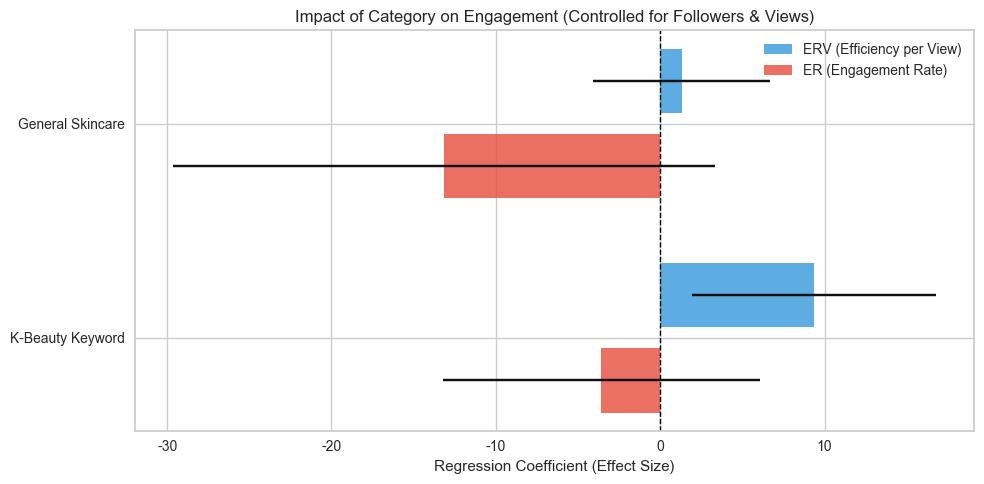

In [92]:
def extract_res(model, model_name):
    # 주요 변수들만 추출
    target_vars = ['is_k_keyword', 'is_non_k_skincare']
    df = pd.DataFrame({
        'variable': target_vars,
        'coef': model.params[target_vars],
        'low': model.conf_int().loc[target_vars, 0],
        'upp': model.conf_int().loc[target_vars, 1],
        'model': model_name
    })
    return df

# 1. 데이터 정리
res_erv = extract_res(model_erv, 'ERV (조회수 대비 반응)')
res_er = extract_res(model_er, 'ER (팔로워 대비 반응)')
final_res = pd.concat([res_erv, res_er])

# 2. 시각화 (Coefficient Plot)
fig, ax = plt.subplots(figsize=(10, 5))
y_labels = ['K-Beauty Keyword', 'General Skincare']
y_pos = np.arange(len(y_labels))

# ERV 그리기
ax.barh(y_pos + 0.2, res_erv['coef'], xerr=[res_erv['coef']-res_erv['low'], res_erv['upp']-res_erv['coef']],
        height=0.3, label='ERV (Efficiency per View)', color='#3498db', alpha=0.8)

# ER 그리기
ax.barh(y_pos - 0.2, res_er['coef'], xerr=[res_er['coef']-res_er['low'], res_er['upp']-res_er['coef']],
        height=0.3, label='ER (Engagement Rate)', color='#e74c3c', alpha=0.8)

ax.axvline(0, color='black', linestyle='--', linewidth=1)
ax.set_yticks(y_pos)
ax.set_yticklabels(y_labels)
ax.set_xlabel('Regression Coefficient (Effect Size)')
ax.set_title('Impact of Category on Engagement (Controlled for Followers & Views)')
ax.legend()
plt.tight_layout()
plt.show()

|분석 지표|핵심 결과|비즈니스 인사이트|
|-|-|-|
|ERV (탐색 반응)|K-Beauty 효과 유의(p=0.014)|K-beauty 키워드는 모르는 사람(탐색 탭 유입자)에게 클릭과 반응을 이끌어내는 강력한 힘이 있음|
ER (기존 팬 반응)|키워드 효과 미비|기존 팔로워들은 제품 카테고리(K-beauty 여부)보다는 인플루언서와의 관계나 콘텐츠 자체의 퀄리티에 더 민감함|
|K-Premium|차이 8.03 (p=0.08)|단순 스킨케어 포스팅보다 'K-beauty'를 강조한 포스팅이 외부 유입 유저에게 8%p 가량 더 높은 효율을 보임.|

1️⃣ ERV 회귀 결과 (3그룹 비교)

모델:
ERV ~ is_k_keyword + is_non_k_skincare + log(follower) + log(view)
(기준 그룹: Others / 비(非) 스킨케어·비 K-beauty 콘텐츠)


ERV 회귀계수 및 해석

|계수명 | 값 (p-value) | 해석|
|-|-|-|
|Intercept | 48.31 (p=0.025) | 기준 그룹(others)에서 팔로워·조회수 1 기준일 때의 예상 ERV 수준|
|is_k_keyword | +9.35 (p=0.014) | 통계적으로 유의. 일반 콘텐츠 대비 K-beauty 해시태그 사용 시 ERV가 평균 약 +9.35%p 증가. 팔로워 수와 조회수를 보정한 후에도 K-beauty 정체성 키워드의 추가 반응성 효과가 존재함을 의미|
|is_non_k_skincare | +1.32 (p=0.631) | 유의하지 않음. 일반 콘텐츠 대비 generic skincare 해시태그 사용만으로는 ERV 상승 효과가 확인되지 않음|
|log_follower | -1.36 (p=0.387) | 유의하지 않음. 팔로워 수 증가는 ERV에 뚜렷한 영향 없음|
|log_view | -1.83 (p=0.055) | 10% 유의수준에서 약한 음의 효과. 조회수가 많을수록 ERV가 다소 낮아지는 경향 → 과도한 노출 시 참여율 희석 가능성|

R-squared = 0.019
설명력은 약 1.9%로 낮지만, K-beauty 키워드 계수 자체는 안정적으로 추정됨.

추가 검정: K-beauty 프리미엄
H0: is_k_keyword = is_non_k_skincare

차이 추정치: +8.03%p
p-value = 0.080

→ generic skincare 대비 K-beauty 키워드가 추가적인 ERV 프리미엄을 가질 가능성은 있으나, 5% 유의수준에서는 경계선.
방향성과 크기는 일관되게 양(+)이며, 표본 확장 시 유의성 확보 가능성이 있는 결과.



모형 적합도
R-squared = 0.019

→ 설명력은 낮음(약 1.9%)
→ 다만 이는 ERV가 본질적으로 변동성이 큰 비율 지표이기 때문이며,
→ **K-beauty 계수의 방향성과 유의성 자체는 안정적으로 관측됨**

---

K-beauty 프리미엄 검정 (ERV 기준)

가설:
H₀: is_k_keyword = is_non_k_skincare
→ K-beauty는 단순히 ‘스킨케어 콘텐츠’일 뿐, 추가 프리미엄은 없다

검정 결과:
(K-beauty − Generic skincare) = +8.03
p = 0.080

해석:
→ K-beauty 콘텐츠는 Generic skincare 대비 ERV가 약 +8%p 높은 경향
→ 5% 유의수준에서는 유의하지 않으나, 10% 기준에서는 **경계적 유의**
→ K-beauty가 단순 스킨케어 효과를 넘어 **추가적인 반응성 프리미엄을 가질 가능성**을 시사
→ 다만 표본 수와 인플루언서 이질성을 고려할 때 강한 단정은 유보 필요

---

🔥 ERV 해석 요약 (3그룹 관점)

* ERV는 팔로워·조회수 효과를 보정한 **순수 반응률 지표**
* Generic skincare 콘텐츠는 Others 대비 뚜렷한 우위를 보이지 않음
* 반면 **K-beauty 콘텐츠만 ERV에서 일관되고 유의한 상승 효과를 보임**
* 즉, 반응성 증가는 “스킨케어냐 아니냐”가 아니라
  **“K-beauty 정체성 키워드를 사용하는가”에 의해 설명됨**

---

2️⃣ ER 회귀 결과 (3그룹 비교)

모델:
ER ~ is_k_keyword + is_non_k_skincare + log(follower) + log(view)
(기준 그룹: Others)

|계수명 | 값 (p-value) | 해석|
|-|-|-|
|Intercept | 62.02 (p=0.010) | 기준 그룹에서의 기본 ER 수준|
|is_k_keyword | -3.57 (p=0.468) | 유의하지 않음. K-beauty 키워드 사용 여부는 ER에 뚜렷한 영향 없음|
|is_non_k_skincare | -13.15 (p=0.119) | 유의하지 않음. generic skincare 콘텐츠 역시 ER 상승 효과 확인되지 않음|
|log_follower | -20.13 (p=0.002) | 통계적으로 유의. 팔로워 수가 증가할수록 ER은 감소 → 대형 계정일수록 상대적 참여율 하락|
|log_view | +18.95 (p=0.002) | 통계적으로 유의. 조회수가 많을수록 ER 상승 → 노출 대비 반응성 증가|


모형 적합도
R-squared = 0.134

→ 설명력 약 13.4%
→ ER은 계정 규모·노출량에 민감한 지표임을 확인

---

K-beauty 프리미엄 검정 (ER 기준)

(K-beauty − Generic skincare) = +9.57
p = 0.190

→ ER 기준에서는 K-beauty와 Generic skincare 간 차이 유의하지 않음
→ ER은 계정 규모 효과에 강하게 영향을 받아
키워드 고유 효과를 분리해내는 데 한계 존재

---

### 🔹 종합 결론 (3그룹 회귀 기반)

1. ERV 기준
   - K-beauty > non-K skincare ≈ others 구조가 관찰됨
   - 단순히 “스킨케어 콘텐츠”이기 때문이 아니라, K-beauty라는 정체성 키워드 자체가 추가 반응성을 만들어냄
   - 팔로워·조회수 보정 후에도 효과 유지 → 구조적 반응성 차이
2. ER 기준
   - 키워드 효과는 사라지고, 팔로워·조회수 같은 계정 규모 요인이 지배적
   - ER은 키워드 마케팅 효과 분석 지표로는 부적합
3. 분석적 메시지
   - 본 분석은 3그룹 비교 분석이며 “K-beauty vs skincare vs 일반 콘텐츠” 간 반응성 구조 차이를 정량적으로 분리해 보여줌

인과 해석을 위해서는 향후 콘텐츠 토픽 통제, 업로드 주기 통제, PSM 또는 패널 회귀 확장이 필요

|구분|PyCaret|AutoGluon|
|-|-|-|
|핵심 철학|Low-Code Library (워크플로우 자동화)|Ensemble & Stacking (최고 성능 추구)|
|강점|"데이터 전처리, 시각화, 모델 비교가 매우 빠름"|딥러닝과 복잡한 앙상블 기법으로 예측력이 뛰어남|
|모델 구조|단일 모델 중 가장 좋은 것을 찾고 튜닝|여러 모델을 겹쳐서 쌓는 '멀티레이어 스태킹' 사용|
|난이도|분석 과정을 제어하기 쉬움 (사용자 중심)|코드 한 줄로 끝나지만 내부 구조는 블랙박스에 가까움|
|추천 상황|통계적 해석과 빠른 프로토타이핑이 필요할 때|해석보다는 무조건 높은 정확도가 목표일 때|

In [93]:
# 1. 파생 변수 생성: 팔로워 대비 조회수 비중 (Viral Efficiency)
tmp_df['view_to_follower_ratio'] = tmp_df['log_view'] / tmp_df['log_follower']

# 2. 분석용 데이터 재구성
# 기존 변수와 새로운 변수를 모두 포함합니다.
data_ml_v2 = tmp_df[['ERV', 'is_k_keyword', 'is_non_k_skincare', 
                     'log_follower', 'log_view', 'view_to_follower_ratio']]

# 3. PyCaret 재설정
from pycaret.regression import *
s = setup(data=data_ml_v2, target='ERV', train_size=0.8, session_id=123)

# 4. 모델 비교
best_model_v2 = compare_models()

,Description,Value
0,Session id,123
1,Target,ERV
2,Target type,Regression
3,Original data shape,"(1680, 6)"
4,Transformed data shape,"(1680, 6)"
5,Transformed train set shape,"(1344, 6)"
6,Transformed test set shape,"(336, 6)"
7,Numeric features,5
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
huber,Huber Regressor,12.4715,3716.3472,51.5816,-0.0167,0.8659,2.7781,0.0060
dummy,Dummy Regressor,14.7845,3709.9930,51.6563,-0.0435,1.0394,5.4634,0.0030
en,Elastic Net,14.8708,3664.4014,51.5047,-0.0736,1.0118,3.5236,0.0030
omp,Orthogonal Matching Pursuit,14.9582,3678.3652,51.6325,-0.0822,1.0205,3.5932,0.0040
lasso,Lasso Regression,14.9848,3659.1220,51.5056,-0.0834,1.0099,3.3555,0.0040
llar,Lasso Least Angle Regression,14.9848,3659.1215,51.5056,-0.0834,1.0099,3.3555,0.0030
br,Bayesian Ridge,15.0363,3659.8678,51.5370,-0.0871,1.0136,3.2972,0.0030
ridge,Ridge Regression,15.4219,3657.0981,51.6194,-0.1101,1.0242,3.1297,0.0040
lr,Linear Regression,15.4538,3658.0181,51.6355,-0.1120,1.0143,3.1189,0.4430
lar,Least Angle Regression,15.4878,3660.4577,51.6500,-0.1123,1.0155,3.1254,0.0040


In [94]:
tmp_df.head()

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,upload_date_str,upload_y_m,group,ER,ERV,is_k_keyword,is_non_k_skincare,log_follower,log_view,view_to_follower_ratio
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,2024-09-23,2024-09,k_keyword,1.16,10.28,1,0,11.31,9.13,0.81
298,.blissdiaries,81700.00,2024-09-27,8462,923,46,116,I recieved this product for free from picky an...,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi...",i recieved this product for free from picky an...,...,2024-09-27,2024-09,k_keyword,1.33,12.82,1,0,11.31,9.04,0.80
295,.blissdiaries,81700.00,2024-09-28,16300,2106,62,298,yesstyle perfect lips mix & match- swatches 🎀🩰...,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y...",yesstyle perfect lips mix match swatches 🎀🩰 u...,...,2024-09-28,2024-09,k_keyword,3.02,15.13,1,0,11.31,9.70,0.86
296,.blissdiaries,81700.00,2024-09-28,16600,2550,71,321,i cant help it okay 💔💔 use yesstyle rewards co...,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#...",i cant help it okay 💔💔 use yesstyle rewards co...,...,2024-09-28,2024-09,k_keyword,3.60,17.72,1,0,11.31,9.72,0.86
297,.blissdiaries,81700.00,2024-09-28,15700,2456,73,454,yesstyle perfect lips - mix & match 🐰🎀 the cut...,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y...",yesstyle perfect lips mix match 🐰🎀 the cutes...,...,2024-09-28,2024-09,k_keyword,3.65,19.00,1,0,11.31,9.66,0.85


In [95]:
from util.repo_paths import AUTOGLUON_DIR
# 데이터 준비
data_ml = tmp_df[['ERV', 'is_k_keyword', 'is_non_k_skincare', 
                'log_follower', 'log_view']].copy()
data_ml['view_to_follower_ratio'] = data_ml['log_view'] / data_ml['log_follower']


# import os
# import gc
# import shutil
# import pandas as pd
# from autogluon.tabular import TabularPredictor

# # 1. 경로 설정
# base_path = str(AUTOGLUON_DIR)
# model_name = "ag_tiktok_final_dl"
# full_model_path = os.path.join(base_path, model_name)

# # 2. 강제 초기화
# if os.path.exists(full_model_path):
#     print(f"🗑️ Deleting existing model folder at {full_model_path}")
#     shutil.rmtree(full_model_path)

# gc.collect()


# # 4. 새 모델 학습 (DyStack 비활성화로 에러 원천 차단)
# print(f"🚀 Training with Deep Learning at {full_model_path}...")

# predictor = TabularPredictor(
#     label='ERV', 
#     eval_metric='mae', 
#     path=full_model_path
# ).fit(
#     data_ml,
#     # 딥러닝 포함 하이퍼파라미터
#     hyperparameters={
#         'NN_TORCH': {}, 
#         'FASTAI': {}, 
#         'GBM': {}, 
#         'CAT': {}, 
#         'XGB': {}
#     },
#     # 중요: DyStack(Dynamic Stacking)을 수동으로 끕니다.
#     dynamic_stacking=False, 
#     num_stack_levels=1,
#     num_bag_folds=5,
#     time_limit=400,
#     refit_full=False,
#     set_best_to_refit_full=False,
#     save_space=True
# )

# # 5. 결과 확인
# print("\n📊 Model Leaderboard:")
# print(predictor.leaderboard(data_ml, silent=True))

# print("\n🔑 Feature Importance:")
# importance = predictor.feature_importance(data_ml)
# print(importance)

In [96]:
from util.repo_paths import AUTOGLUON_DIR
"""
# 1. 모델 경로
models_folder = str(AUTOGLUON_DIR)
model_path = os.path.join(models_folder, "ag_tiktok_final_dl")

# 2. 모델 로드
predictor = TabularPredictor.load(model_path)

# 3. 리더보드
print("📊 [모델 리더보드]")
leaderboard = predictor.leaderboard(silent=True)
print(leaderboard)

# 4. 변수 중요도
print("\n🔑 [최종 변수 중요도]")
importance = predictor.feature_importance(data_ml)
print(importance)

위 방법은 파이썬 버전문제로 열리지 않는데, colab 환경에서 모델링해서 가져왔기 때문에 어쩔 수 없음.
아래 방법은 autogluon에서 권장하는 우회 방법 사용.

핵심 모델: CatBoost / XGBoost / LightGBM
NeuralNet 비중: 매우 낮음 (앙상블 가중치 거의 없음)
PyTorch CUDA 미사용 (CPU)
따라서 Python 3.11 ↔ 3.12 차이로 인한 수치 변동 가능성 거의 0. 재현성 리스크 실무적으로 무시 가능
"""

import os
from autogluon.tabular import TabularPredictor

models_folder = str(AUTOGLUON_DIR)
model_path = os.path.join(models_folder, "ag_tiktok_final_dl")

predictor = TabularPredictor.load(
    model_path,
    require_py_version_match=False,
    require_version_match=False
)

print("📊 [모델 리더보드]")
print(predictor.leaderboard(silent=True))

Found 2 mismatches between original and current metadata:


📊 [모델 리더보드]
                     model  score_val          eval_metric  pred_time_val  \
0      WeightedEnsemble_L3      -9.64  mean_absolute_error           0.42   
1          CatBoost_BAG_L2      -9.65  mean_absolute_error           0.38   
2      WeightedEnsemble_L2      -9.82  mean_absolute_error           0.09   
3          CatBoost_BAG_L1      -9.82  mean_absolute_error           0.02   
4    NeuralNetTorch_BAG_L1     -11.27  mean_absolute_error           0.12   
5           XGBoost_BAG_L1     -11.57  mean_absolute_error           0.07   
6           XGBoost_BAG_L2     -11.90  mean_absolute_error           0.41   
7          LightGBM_BAG_L2     -12.09  mean_absolute_error           0.39   
8   NeuralNetFastAI_BAG_L2     -12.29  mean_absolute_error           0.48   
9          LightGBM_BAG_L1     -12.70  mean_absolute_error           0.04   
10  NeuralNetFastAI_BAG_L1     -13.54  mean_absolute_error           0.12   

    fit_time  pred_time_val_marginal  fit_time_marginal  stack_

score_val
- 검증 데이터 기준 성능 (여기서는 -MAE 형태)
- 0에 가까울수록 좋음

WeightedEnsemble_L3
- 여러 모델을 조합한 최종 모델

변수 중요도 값 (feature importance)

| 컬럼           | 의미                              |
| ------------ | ------------------------------- |
| `importance` | 해당 변수가 없으면 **예측 오차가 얼마나 증가하는지** |
| `stddev`     | 중요도 계산의 변동성                     |
| `p_value`    | 중요도가 우연일 확률 (0에 가까울수록 확실)       |


In [97]:
from util.repo_paths import AUTOGLUON_DIR
"""
print("\n🔑 [변수 중요도]")
importance = predictor.feature_importance(data_ml)
print(importance)
위 방법도 에러남. numpy버전 문제로, 

AutoGluon의 feature_importance()는 Permutation Importance 방식이다.

이 과정에서 내부적으로 NumPy random generator를 사용하는데, 학습 당시 RNG state 를 직렬화된 상태 그대로 복원하려고 시도한다
그런데 넘파이의 버전별 RNG 구현 방식이 다름.
python 3.12 (Colab 최신) - MT19937 (new API)
python 3.11 (conda numpy) - legacy 인식
NumPy 내부 BitGenerator 클래스 경로가 달라짐. 그래서 permutation shuffle 단계에서만 폭발

TabularPredictor.load, predict, leaderboard 이 세개는 이미 학습된 모델 객체만 사용해서 정상동작.
feature_importance(data_ml) 이거는 새로운 랜덤 셔플, 새로운 평가 루프, NumPy RNG 재초기화를 요구하기에 실패.
(AutoGluon + NumPy + Python cross-version 조합 구조적 문제임)

해결방법 : Colab에서 Feature Importance 결과를 Export
"""

importance = pd.read_csv(str(AUTOGLUON_DIR / "feature_importance.csv"), index_col=0)
print(importance)

                        importance  stddev  p_value  n  p99_high  p99_low
log_follower                  4.79    0.12     0.00  5      5.04     4.53
log_view                      2.19    0.04     0.00  5      2.26     2.11
view_to_follower_ratio        1.83    0.08     0.00  5      1.98     1.67
is_k_keyword                  0.99    0.04     0.00  5      1.07     0.90
is_non_k_skincare             0.24    0.03     0.00  5      0.30     0.18



| 변수                              | 중요도                          | 해석 |
| ------------------------------- | ---------------------------- | -- |
| `log_follower = 4.79`           | 이 변수를 제거하면 MAE가 약 **4.8 증가** |    |
| `log_view = 2.19`               | 제거 시 MAE 약 **2.2 증가**        |    |
| `view_to_follower_ratio = 1.83` | 바이럴 효율이 예측에 의미 있음            |    |
| `is_k_keyword = 0.99`           | K-beauty 키워드 효과 존재           |    |
| `is_non_k_skincare = 0.24`      | 영향은 작음                       |    |


--- 


**(1) 예측 성능 관점 결론**

| 구분                               | MAE (↓ 낮을수록 좋음) | 해석                 |
| -------------------------------- | --------------- | ------------------ |
| **AutoGluon (Best Ensemble)**    | **≈ 9.6**       | 가장 높은 예측 정확도       |
| PyCaret (Best: Huber / CatBoost) | ≈ 12.4 ~ 13.3   | AutoGluon 대비 성능 열세 |

**동일 피처셋 기준, AutoGluon이 PyCaret보다 ERV 예측 정확도가 명확히 우수**

---

**(2) 변수 중요도 관점 결론 (AutoGluon 기준)**

| 변수                       | 중요도           | 해석                      |
| ------------------------ | ------------- | ----------------------- |
| `log_follower`           | **4.79 (1위)** | 계정 규모가 ERV에 가장 큰 영향     |
| `log_view`               | 2.19          | 조회수 자체의 절대 효과           |
| `view_to_follower_ratio` | 1.83          | **팔로워 대비 조회 효율 (바이럴성)** |
| `is_k_keyword`           | 0.99          | K-beauty 키워드 효과는 존재     |
| `is_non_k_skincare`      | 0.24          | 영향은 있으나 미미              |

**“얼마나 큰 계정인가 + 얼마나 효율적으로 조회가 나오나”가 ERV의 핵심 결정 요인**

---

2️⃣ PyCaret 결과 해석 (왜 성능이 낮게 나왔는가)

**PyCaret 결과 요약**

| 항목         | 값               |
| ---------- | --------------- |
| Best Model | Huber Regressor |
| Best MAE   | ~12.47          |
| R²         | 대부분 음수          |
| 모델 경향      | 선형/준선형 모델 우세    |

**해석**

* PyCaret 기본 비교는:
  * **KFold 기반**
  * 모델 튜닝 제한적
  * 복잡한 상호작용 학습에 불리

* ERV는:
  * scale 효과
  * 비선형성
  * threshold / interaction (예: 팔로워 × 조회 효율)이 강함

👉 **단순 선형 계열 모델로는 한계가 명확**

---

3️⃣ AutoGluon 결과 해석

**AutoGluon 특징**

| 항목    | AutoGluon                                |
| ----- | ---------------------------------------- |
| 모델 구성 | CatBoost / XGBoost / LightGBM + Ensemble |
| 학습 전략 | Bagging + Stacking                       |
| 비선형성  | 자동 학습                                    |
| 상호작용  | 자동 포착                                    |

**Leaderboard에서 보이는 구조**

* 상위 모델:
  * CatBoost_BAG
  * WeightedEnsemble_L2/L3

* NeuralNet 비중 낮음 → **트리 기반이 핵심**

**“복잡한 패턴을 잘 잡는 모델 + 앙상블” 구조가 성능 차이를 만듦**

---

4️⃣ PyCaret vs AutoGluon 정리 표

| 구분     | PyCaret  | AutoGluon |
| ------ | -------- | --------- |
| 목적     | 빠른 베이스라인 | 최고 예측 성능  |
| 모델 탐색  | 제한적      | 매우 광범위    |
| 앙상블    | 제한적      | 기본 내장     |
| 비선형 처리 | 약함       | 강함        |
| 해석 용이성 | 높음       | 중간        |
| 최종 MAE | ~12~13   | **~9.6**  |

---

5️⃣ 이 분석에서 중요한 방법론적 해석

(1) 파생 변수 `view_to_follower_ratio`의 의미

* 단순 조회수(`log_view`)보다 **“계정 규모 대비 성과”를 분리**
* AutoGluon 중요도에서도 상위권 → **유효한 설계**

👉 기존 `log_follower`, `log_view`만 썼을 때보다 **콘텐츠 성과 해석력이 개선됨**

---

(2) 인플루언서 클러스터링과의 관계

* 이 AutoML 분석은 **클러스터를 직접 쓰지 않은** 대신 팔로워 수, 조회 효율, 키워드 특성으로 **간접적으로 인플루언서 특성을 학습**

👉 **예측 목적에서는 클러스터링 없이도 충분히 성능 확보 가능**

(단, 인과 해석은 별도 FE/Cluster 회귀로 처리)

---

6️⃣ 요약

> AutoGluon은 비선형성과 상호작용을 자동으로 학습하는 앙상블 구조를 통해
> PyCaret 대비 ERV 예측 성능(MAE)을 크게 개선했으며,
> ERV의 핵심 결정 요인은 **팔로워 규모, 조회수, 그리고 팔로워 대비 조회 효율**로 확인되었다.



----

정량적 가치로 환산하기


총 추가 참여 = (총 조회수 / 10,000) × (1만뷰당 추가 참여)


In [100]:
tmp_df.columns

Index(['name', 'follower_cnt', 'upload_date', 'view_cnt', 'like_cnt',
       'comment_cnt', 'save_cnt', 'info', 'hash_tag', 'cleaned_info',
       'cleaned_hash_tag', 'tokenized_info', 'tokenized_hash_tag',
       'removed_info', 'removed_hash_tag', 'stpw_processed_info',
       'stpw_processed_hash_tag', 'tiktoker_size', 'ad_cost', 'prev_date',
       'upload_gap', 'upload_gap_diff', 'avg_upload_gap_change',
       'upload_date_str', 'upload_y_m', 'group', 'ER', 'ERV', 'is_k_keyword',
       'is_non_k_skincare', 'log_follower', 'log_view',
       'view_to_follower_ratio'],
      dtype='object')

In [101]:
# ===============================
# 1. 회귀 기반 K-beauty 프리미엄
# ===============================
k_keyword_coef = 9.35  # ERV +%p (회귀 계수)
# from OLS: ERV ~ is_k_keyword + log_follower + log_view
# Step 2: Non-K Skincare vs K-Beauty

value_per_engagement = 100  # 참여 1건당 가치 (원)

df = tmp_df.copy()

# -------------------------------
# 2. 기준 그룹 (Others) ERV
# -------------------------------
baseline_erv = df[
    (df['is_k_keyword'] == 0) &
    (df['is_non_k_skincare'] == 0)
]['ERV'].mean()

baseline_erv_frac = baseline_erv / 100  # % → 소수

# -------------------------------
# 3. K-beauty 적용 시 ERV
# -------------------------------
erv_with_k_frac = baseline_erv_frac + k_keyword_coef / 100

# -------------------------------
# 4. 1만 뷰 기준 가치 환산
# -------------------------------
views_unit = 10_000

delta_engagement = views_unit * (erv_with_k_frac - baseline_erv_frac)
delta_value = delta_engagement * value_per_engagement

# -------------------------------
# 5. 출력
# -------------------------------
print(
    f"[1만 뷰 기준]\n"
    f"추가 참여수: {delta_engagement:,.0f}건\n"
    f"추가 금액: {delta_value/1e4:,.2f}만원"
)


[1만 뷰 기준]
추가 참여수: 935건
추가 금액: 9.35만원


그룹별 ERV 기반 추가 참여 효과(금액 환산)

k_keyword 그룹:
K-beauty 해시태그 적용으로 인해 추정 추가 참여량은 약 1,500만 건,
이를 금액 가치로 환산하면 약 15.01억 원 수준의 기대효과가 발생하는 것으로 나타났다.

others 그룹:
해시태그를 사용하지 않은 게시물은 약 695만 건의 잠재 참여를 확보하지 못한 것으로 추정되며,
이는 금액 기준 약 6.96억 원 규모의 기회비용(Opportunity Cost)으로 해석된다.

---

# nano, micro, middle 인 그룹, 아닌 그룹들 er 비교, 들이는 금액 대비 효과 n% 상승

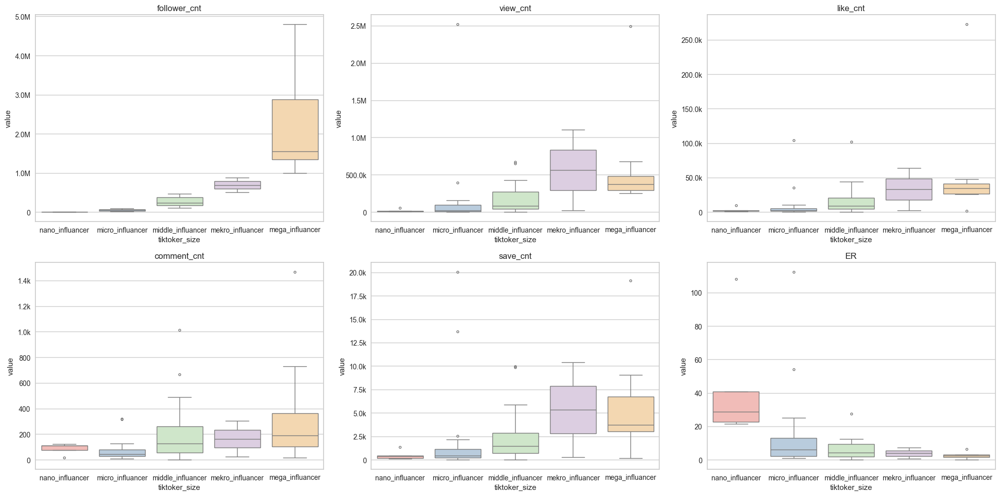

In [ ]:
cols2 = ['follower_cnt', 'view_cnt', 'like_cnt', 'comment_cnt', 'save_cnt', 'ER']
size_order = ['nano_influancer', 'micro_influancer', 'middle_influancer', 'mekro_influancer', 'mega_influancer']

# 박스플롯 시각화
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for ax, col in zip(axes.flatten(), cols2):
    sns.boxplot(
        x='tiktoker_size',
        y=col,
        data=mean_df,
        ax=ax,
        palette='Pastel1',
        order=size_order,  # 원하는 순서
        fliersize=3
    )
    ax.set_title(col)
    ax.set_ylabel("value")
    ax.yaxis.set_major_formatter(formatter)
plt.tight_layout()
plt.show()


----

In [ ]:
# 코릴레이션 구하기
mean_df.rename(columns={'upload_gap':'avg_upload_interval'}, inplace=True)
corr_df = mean_df[["view_cnt","like_cnt","comment_cnt",	"save_cnt",	 "ad_cost",	"ER",	"avg_upload_interval","follower_cnt"]]
corr_df.corr()

,view_cnt,like_cnt,comment_cnt,save_cnt,ad_cost,ER,avg_upload_interval,follower_cnt
view_cnt,1.00,0.88,0.60,0.89,0.47,0.39,-0.12,0.47
like_cnt,0.88,1.00,0.76,0.82,0.56,0.20,-0.10,0.56
comment_cnt,0.60,0.76,1.00,0.66,0.45,0.03,-0.13,0.45
save_cnt,0.89,0.82,0.66,1.00,0.35,0.43,-0.12,0.35
ad_cost,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00
ER,0.39,0.20,0.03,0.43,-0.18,1.00,0.03,-0.18
avg_upload_interval,-0.12,-0.10,-0.13,-0.12,-0.18,0.03,1.00,-0.18
follower_cnt,0.47,0.56,0.45,0.35,1.00,-0.18,-0.18,1.00


In [ ]:
# 마이크로 인플루언서 추출
micro_df = mean_df[mean_df['tiktoker_size'] == 'micro_influancer']
micro_df.reset_index(drop=True, inplace=True)

# er : 5% 이상, 업로드 주기 : 1주일 이하인 마이크로 인플루언서 추출
micro_df[(micro_df['ER'] >= 5) & (micro_df['avg_upload_interval'] < 7)].reset_index()

# 다음 10명의 영상들을 시정하고 얼굴이 안나오는 인플루언서, 자사 컨셉과 맞지않는 인플루언서, 광고 목적에 맞지 않는 인플루언서 제외
# 남은 5명의 인플루언서들 중 가장 광고에 적합한 컨텐츠를 올리는 인플루언서 2명 선정 : emchu, krystallee2222

,index,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,avg_upload_interval,tiktoker_size,ad_cost,ER,ERV,EV,EV_residual
0,1,4chriisty,79500.00,26122.50,4119.73,74.13,385.37,2.48,micro_influancer,1590000000.00,5.28,17.53,4579.23,0.30
1,2,__.annie.s,37300.00,10332.73,2375.10,128.47,465.10,3.14,micro_influancer,746000000.00,6.71,28.73,2968.67,0.66
2,3,_luvwonsnnx,23900.00,8783.47,1593.63,57.87,261.97,1.48,micro_influancer,478000000.00,6.91,21.78,1913.47,0.36
3,4,aeiezo.pdf,21400.00,20647.13,2587.73,95.90,350.23,3.48,micro_influancer,428000000.00,12.54,14.69,3033.87,0.09
4,8,emchu_,72700.00,39188.43,4089.50,33.50,549.13,3.41,micro_influancer,1454000000.00,5.67,11.92,4672.13,-0.02
5,10,its.kaylas,51100.00,24006.93,4257.87,32.47,874.60,1.31,micro_influancer,1022000000.00,8.40,21.51,5164.93,0.50
6,13,krystallee2222,65200.00,392343.33,35183.00,120.30,13670.83,2.24,micro_influancer,1304000000.00,54.15,12.48,48974.13,0.38
7,14,kwyeona,29000.00,18345.80,3900.70,317.47,824.53,2.31,micro_influancer,580000000.00,14.55,27.49,5042.70,0.70
8,16,ofeemi7,98700.00,152066.00,8523.07,28.90,2160.83,1.34,micro_influancer,1974000000.00,8.66,7.04,10712.80,-0.34
9,19,thelipstickgirly,92900.00,2518470.00,104070.37,319.57,20036.77,2.76,micro_influancer,1858000000.00,112.37,4.94,124426.70,-0.27


##### 2-5. 인플루언서 영상 주제 라벨링 및 주요 컨셉 추출

In [178]:
# 토픽별 키워드 설정
topics = {
    "색조 메이크업": ["blush", "eyeshadow", "lipstick", "makeuplook",'wakemake','eye palette', 'makeup','grwmmakeup',"foundation", "concealer", "basemakeup", "primer"],
    "스킨케어 & 피부 관리": ["skincare", "glassskin", "moisturizer", "serum",'mixsoon','glow','skin','dermatologist','exfoliating','toner','reedle shot','cleansing','acne'],
    "헤어 & 바디케어": [ "bodycare",  "bodymist",'hair'],
    "패션 & 스타일링": ["fashion", "ootd", "style", "trendy"],
    "언박싱 & 쇼핑": ["unboxing", "haul", "shopping", "firstimpression",'miniso'],
    "피부관리 루틴": ["morningroutine", "nightroutine", "selfcare", "routine"],
    "이슈 & 트렌드": ["trending", "viral", "tiktokban"],
    "ASMR & 감성 콘텐츠": ["asmr", "relaxing", "aesthetic", "vlog", 'grwm', 'gurwm',"study", "studymotivation", "productivity"],
    "먹방" : ['eating','eat','flavor','flavors','buldak','ramen']
}

# 각 행에 해당하는 토픽을 할당하는 함수
def assign_topic(text):
    assigned_topics = []
    for topic, keywords in topics.items():
        if any(keyword in text.lower() for keyword in keywords):
            assigned_topics.append(topic)
    return ", ".join(assigned_topics) if assigned_topics else "기타"

# 데이터프레임에 새로운 토픽 열 추가
tiktoker_df["cleaned_info"] = tiktoker_df["cleaned_info"].astype(str).fillna("")
tiktoker_df["topic"] = tiktoker_df["cleaned_info"].apply(assign_topic)

# 분류된 데이터 상위 10개 확인
tiktoker_df.head(10)


,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,81700.00,2024-09-27,8462,923,46,116,I recieved this product for free from picky an...,"@Picky,@Picky,@Dr.G,#foryou,#pickyreview,#gopi...",i recieved this product for free from picky an...,...,[gforyoupickyreviewgopickypickyxdrgdrgkbeautyw...,micro_influancer,1634000000.00,2024-09-23,4.00,NaN,-0.11,2024-09-27,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,81700.00,2024-09-28,16300,2106,62,298,yesstyle perfect lips mix & match- swatches 🎀🩰...,"@YesStyleInfluencers,#fyp,#foryou,#yesstyle,#y...",yesstyle perfect lips mix match swatches 🎀🩰 u...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-27,1.00,-3.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,81700.00,2024-09-28,16600,2550,71,321,i cant help it okay 💔💔 use yesstyle rewards co...,"#fyp,#foryou,#yesstyle,#lippies,#wonyoungism,#...",i cant help it okay 💔💔 use yesstyle rewards co...,...,[fypforyouyesstylelippieswonyoungismwonyounggi...,micro_influancer,1634000000.00,2024-09-28,0.00,-1.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,81700.00,2024-09-28,15700,2456,73,454,yesstyle perfect lips - mix & match 🐰🎀 the cut...,"@YesStyle,@YesStyleInfluencers,#fyp,#foryou,#y...",yesstyle perfect lips mix match 🐰🎀 the cutes...,...,[fypforyouyesstyleyesstyleinfluencersyesstyleb...,micro_influancer,1634000000.00,2024-09-28,0.00,0.00,-0.11,2024-09-28,2024-09,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
294,.blissdiaries,81700.00,2024-09-30,10300,975,69,106,Purito seoul August supporters campaign 🎋 - Pu...,"@Purito,#fyp,#foryou,#purito,#wonyoungism,#won...",purito seoul august supporters campaign 🎋 pur...,...,[fypforyoupuritowonyoungismwonyoungskincarekor...,micro_influancer,1634000000.00,2024-09-28,2.00,2.00,-0.11,2024-09-30,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, 이슈 & 트렌드"
292,.blissdiaries,81700.00,2024-10-02,30300,5389,138,877,decorate my clio palette with me 🐰🎀 clio palet...,"@yesstyleinfluencers,@cliocosmetics_global,#fy...",decorate my clio palette with me 🐰🎀 clio palet...,...,[fypforyouwonyoungismwonyoungclioyesstyleyesst...,micro_influancer,1634000000.00,2024-09-30,2.00,0.00,-0.11,2024-10-02,2024-10,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
293,.blissdiaries,81700.00,2024-10-02,14500,1831,50,267,peach & lily’s glass skin refining serum ⋆౨ৎ˚⟡...,"@BAZZAAL,@Peach,#foryou,#wonyoungism,#wonyoung...",peach lily’s glass skin refining serum ⋆౨ৎ˚⟡˖...,...,[foryouwonyoungismwonyoungpeachandlilyglassski...,micro_influancer,1634000000.00,2024-10-02,0.00,-2.00,-0.11,2024-10-02,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 먹방"
291,.blissdiaries,81700.00,2024-10-04,13800,1435,75,166,ive found my new favourite toner pads 😋\n|I us...,"#foryou,#cellfusionc,#cellfuer,#ksuncare\n#las...",ive found my new favourite toner pads 😋\ni use...,...,"[foryoucellfusionccellfuerksuncar, lasersunscr...",micro_influancer,1634000000.00,2024-10-02,2.00,2.00,-0.11,2024-10-04,2024-10,"스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"
290,.blissdiaries,81700.00,2024-10-14,19300,1713,73,282,A must have beauty advent calendar to end 2024...,"@Stylevana,#fyp,#foryou,#kbeauty,#wonyoungism,...",a must have beauty advent calendar to end 2024...,...,[fypforyoukbeautywonyoungismwonyoung25daysofbe...,micro_influancer,1634000000.00,2024-10-04,10.00,8.00,-0.11,2024-10-14,2024-10,"색조 메이크업, 스킨케어 & 피부 관리, 패션 & 스타일링, 언박싱 & 쇼핑"


In [179]:
tiktoker_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1680 entries, 299 to 1230
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   name                     1680 non-null   object        
 1   follower_cnt             1680 non-null   float64       
 2   upload_date              1680 non-null   datetime64[ns]
 3   view_cnt                 1680 non-null   int64         
 4   like_cnt                 1680 non-null   int64         
 5   comment_cnt              1680 non-null   int64         
 6   save_cnt                 1680 non-null   int64         
 7   info                     1664 non-null   object        
 8   hash_tag                 1620 non-null   object        
 9   cleaned_info             1680 non-null   object        
 10  cleaned_hash_tag         1620 non-null   object        
 11  tokenized_info           1664 non-null   object        
 12  tokenized_hash_tag       1620 non-nul

In [180]:
topic_df = tiktoker_df[['name','cleaned_info','topic']]
topic_df

,name,cleaned_info,topic
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑"
296,.blissdiaries,i cant help it okay 💔💔 use yesstyle rewards co...,"색조 메이크업, 패션 & 스타일링"
297,.blissdiaries,yesstyle perfect lips mix match 🐰🎀 the cutes...,"색조 메이크업, 패션 & 스타일링, ASMR & 감성 콘텐츠"
...,...,...,...
1234,widyaatharva01,renungan …\n\n\n\nfyp renungan kematian,기타
1232,widyaatharva01,follow akun baru kit guys \n\n\n\nskincarerout...,"스킨케어 & 피부 관리, 피부관리 루틴"
1233,widyaatharva01,follow akun baru satu lagi ya guys \n\n\n\nski...,"스킨케어 & 피부 관리, 피부관리 루틴"
1231,widyaatharva01,hai sahabat wglow …\napa kabar kakak pastiny...,스킨케어 & 피부 관리


In [208]:
len(topic_df.name.unique())

56

In [181]:
topic_df["color_tf"] = topic_df["topic"].fillna("").apply(lambda x: "색조 메이크업" in x)
topic_df["skincare_tf"] = topic_df["topic"].fillna("").apply(lambda x: "스킨케어 & 피부 관리" in x)
topic_df["hair_body_tf"] = topic_df["topic"].fillna("").apply(lambda x: "헤어 & 바디케어" in x)
topic_df["fashiion_tf"] = topic_df["topic"].fillna("").apply(lambda x: "패션 & 스타일링" in x)
topic_df["unboxing_tf"] = topic_df["topic"].fillna("").apply(lambda x: "언박싱 & 쇼핑" in x)
topic_df["skin_routine_tf"] = topic_df["topic"].fillna("").apply(lambda x: "피부관리 루틴" in x)
topic_df["trend_tf"] = topic_df["topic"].fillna("").apply(lambda x: "이슈 & 트렌드" in x)
topic_df["asmr"] = topic_df["topic"].fillna("").apply(lambda x: "ASMR & 감성 콘텐츠" in x)
topic_df["eating_tf"] = topic_df["topic"].fillna("").apply(lambda x: "먹방" in x)
topic_df['others_tf'] = topic_df["topic"].fillna("").apply(lambda x: "기타" in x)

In [182]:
topic_df.head(3)

,name,cleaned_info,topic,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
299,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
298,.blissdiaries,i recieved this product for free from picky an...,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠",False,True,False,True,False,False,False,True,False,False
295,.blissdiaries,yesstyle perfect lips mix match swatches 🎀🩰 u...,"색조 메이크업, 패션 & 스타일링, 언박싱 & 쇼핑",True,False,False,True,True,False,False,False,False,False


In [183]:
# 토픽별 영상 개수
true_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).sum()
true_counts

color_tf           384
skincare_tf        984
hair_body_tf       114
fashiion_tf        325
unboxing_tf        161
skin_routine_tf    419
trend_tf           243
asmr               474
eating_tf          131
others_tf          204
dtype: int64

In [184]:
# 인플루언서별 각 토픽에 해당하는 영상 개수
influencer_counts = topic_df.iloc[:, 3:].applymap(lambda x: 1 if x else 0).groupby(topic_df.iloc[:, 0]).sum().reset_index()
influencer_counts

,name,color_tf,skincare_tf,hair_body_tf,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf
0,.blissdiaries,18,17,1,29,17,5,3,8,1,0
1,.m.egan,5,13,1,3,4,5,0,2,2,5
2,.woniluv,6,9,2,3,4,9,7,7,1,4
3,4chriisty,10,8,0,15,4,4,3,4,0,3
4,__.annie.s,8,22,0,18,2,7,0,22,0,0
5,_luvwonsnnx,8,21,0,11,7,0,14,27,1,0
6,aeiezo.pdf,4,22,0,3,2,14,5,6,7,6
7,ameenbeautytips,0,29,0,0,0,0,0,0,11,1
8,amyflamy1,12,15,1,5,2,18,0,22,6,4
9,asiamelon,3,20,0,13,5,2,1,1,2,4


In [185]:
# 각 인플루언서별 가장 많이 사용된 topic top3 선정
def get_top_two(row):
    # 각 행에서 'name' 열을 제외하고, 다른 컬럼들에 대해 숫자형으로 변환
    row = row[1:].apply(pd.to_numeric, errors='coerce')
    
    # 가장 큰 두 개의 값을 구함
    top_two = row.nlargest(3)
    
    return pd.Series([top_two.index[0], top_two.index[1], top_two.index[2]], index=['no.1', 'no.2', 'no.3'])

# 'name' 열을 제외하고, 나머지 컬럼에서 가장 큰 두 개의 값 추출
influencer_counts[['no.1', 'no.2', 'no.3']] = influencer_counts.apply(get_top_two, axis=1)

print(influencer_counts[['name', 'no.1', 'no.2', 'no.3']])

                 name             no.1             no.2             no.3
0       .blissdiaries      fashiion_tf         color_tf      skincare_tf
1             .m.egan      skincare_tf         color_tf  skin_routine_tf
2            .woniluv      skincare_tf  skin_routine_tf         trend_tf
3           4chriisty      fashiion_tf         color_tf      skincare_tf
4          __.annie.s      skincare_tf             asmr      fashiion_tf
5         _luvwonsnnx             asmr      skincare_tf         trend_tf
6          aeiezo.pdf      skincare_tf  skin_routine_tf        eating_tf
7     ameenbeautytips      skincare_tf        eating_tf        others_tf
8           amyflamy1             asmr  skin_routine_tf      skincare_tf
9           asiamelon      skincare_tf      fashiion_tf      unboxing_tf
10           ayheyt3u      skincare_tf         color_tf  skin_routine_tf
11         aylennpark      skincare_tf         color_tf        others_tf
12         bwnniewony      skincare_tf             

In [186]:
# Top 3 데이터 확인
display(influencer_counts['no.1'].value_counts())
display(influencer_counts['no.2'].value_counts())
display(influencer_counts['no.3'].value_counts())

no.1
skincare_tf        35
asmr                8
fashiion_tf         3
others_tf           3
color_tf            2
trend_tf            2
hair_body_tf        1
eating_tf           1
skin_routine_tf     1
Name: count, dtype: int64

no.2
color_tf           15
skin_routine_tf    12
skincare_tf         8
fashiion_tf         5
others_tf           5
asmr                4
trend_tf            4
eating_tf           2
hair_body_tf        1
Name: count, dtype: int64

no.3
skin_routine_tf    14
unboxing_tf         6
asmr                6
skincare_tf         5
trend_tf            5
eating_tf           5
color_tf            5
fashiion_tf         4
others_tf           4
hair_body_tf        2
Name: count, dtype: int64

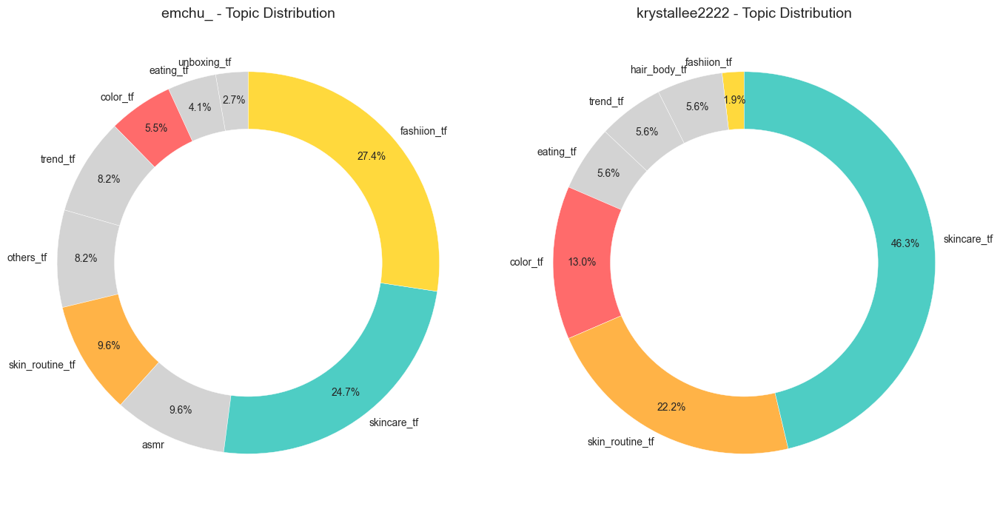

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [187]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

color_mapping = {
    'color_tf': '#FF6B6B',        # 강조: 진한 빨강
    'skincare_tf': '#4ECDC4',     # 강조: 청록 (일반 스킨케어)
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#FFD93D',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#FFB347', # 강조: 오렌지 (스킨 루틴 별도)
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot 생성: 1행 2열
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7))

if len(selected_influencers) == 1:  # 인플루언서가 1명일 때
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    counts = counts[counts > 0].sort_values(ascending=True)
    colors = [color_mapping[col] for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index, 
        autopct='%1.1f%%', 
        startangle=90,
        colors=colors,
        textprops={'fontsize': 10},
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 도넛형
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    ax.add_artist(centre_circle)
    ax.set_title(f'{name} - Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

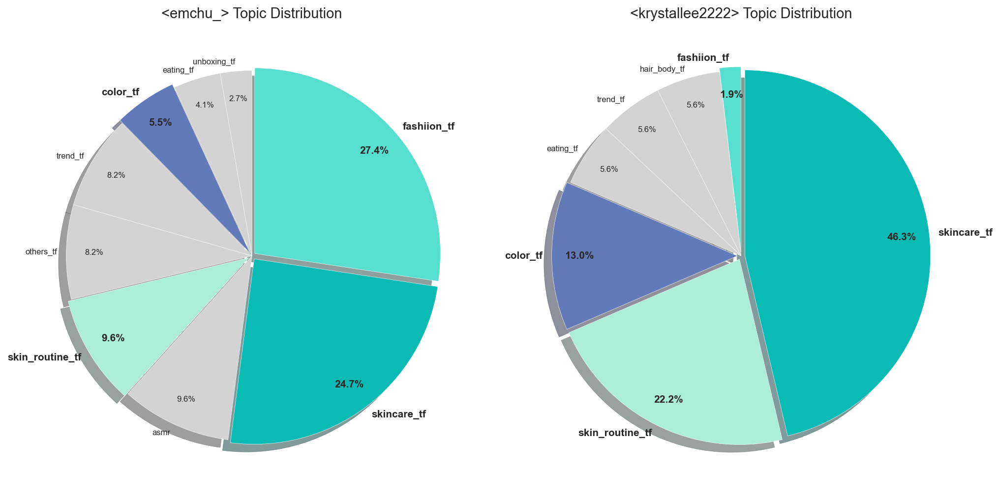

emchu_ Top 3 Topics:
1. fashiion_tf
2. skincare_tf
3. skin_routine_tf

----------------------------------------

krystallee2222 Top 3 Topics:
1. skincare_tf
2. skin_routine_tf
3. color_tf

----------------------------------------



In [188]:
import matplotlib.pyplot as plt

# 색상 매핑
color_mapping = {
    'color_tf': '#637AB9',        # 강조: 진한 빨강
    'skincare_tf': '#0ABAB5',     # 강조: 청록
    'hair_body_tf': '#D3D3D3',    # 톤 다운
    'fashiion_tf': '#56DFCF',     # 강조: 노랑
    'unboxing_tf': '#D3D3D3',     # 톤 다운
    'skin_routine_tf': '#ADEED9', # 강조: 오렌지
    'trend_tf': '#D3D3D3',        # 톤 다운
    'asmr': '#D3D3D3',            # 톤 다운
    'eating_tf': '#D3D3D3',       # 톤 다운
    'others_tf': '#D3D3D3'        # 톤 다운
}

selected_influencers = influencer_counts[influencer_counts['name'].isin(['krystallee2222', 'emchu_'])]

# subplot: 1행 2열, dpi 높게
fig, axes = plt.subplots(1, len(selected_influencers), figsize=(14,7), dpi=150)

if len(selected_influencers) == 1:
    axes = [axes]

for ax, (_, row) in zip(axes, selected_influencers.iterrows()):
    name = row['name']
    topic_cols = influencer_counts.columns[1:11]
    counts = row[topic_cols]
    
    # 0 값 제거 + 오름차순 정렬
    counts = counts[counts > 0].sort_values(ascending=True)
    
    colors = [color_mapping[col] for col in counts.index]
    explode = [0.02 if col in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf'] else 0 for col in counts.index]
    
    wedges, texts, autotexts = ax.pie(
        counts, 
        labels=counts.index,
        autopct='%1.1f%%',
        startangle=90,
        colors=colors,
        explode=explode,
        shadow=True,
        pctdistance=0.85,
        labeldistance=1.05
    )
    
    # 레이블 글자 크기 조정
    for i, text in enumerate(texts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            text.set_fontsize(10)
            text.set_weight('bold')
        else:
            text.set_fontsize(8)
            text.set_weight('light')
    
    # 퍼센트 글자 크기 조정
    for i, at in enumerate(autotexts):
        if counts.index[i] in ['color_tf','skincare_tf','skin_routine_tf','fashiion_tf']:
            at.set_fontsize(10)
            at.set_weight('bold')
        else:
            at.set_fontsize(8)
            at.set_weight('light')
    
    ax.set_title(f'<{name}> Topic Distribution', fontsize=14)

plt.tight_layout()
plt.show()

# Top 3 토픽 출력
for _, row in selected_influencers.iterrows():
    print(f"{row['name']} Top 3 Topics:")
    print(f"1. {row['no.1']}")
    print(f"2. {row['no.2']}")
    print(f"3. {row['no.3']}")
    print("\n" + "-"*40 + "\n")

## PART 3: Tiktoker recommend

In [189]:
mean_df = mean_df.merge(influencer_counts, on='name', how='left')

In [190]:
# 쉼표 제거 및 숫자로 변환
cols_to_int = ["follower_cnt", "view_cnt", "like_cnt", "comment_cnt", "save_cnt", "ad_cost"]
cols_to_float = ["ER", "avg_upload_interval"]

# int로 변환할 컬럼
mean_df[cols_to_int] = mean_df[cols_to_int].replace(",", "", regex=True).astype(float).round(0).astype(int)

# float (소수 둘째 자리까지)로 변환할 컬럼
mean_df[cols_to_float] = mean_df[cols_to_float].replace(",", "", regex=True).astype(float).round(2)
mean_df.head(3)

,name,follower_cnt,view_cnt,like_cnt,comment_cnt,save_cnt,avg_upload_interval,tiktoker_size,ad_cost,ER,...,fashiion_tf,unboxing_tf,skin_routine_tf,trend_tf,asmr,eating_tf,others_tf,no.1,no.2,no.3
0,.blissdiaries,81700,9718,1447,60,196,4.07,micro_influancer,1634000000,1.85,...,29,17,5,3,8,1,0,fashiion_tf,color_tf,skincare_tf
1,.m.egan,238200,178070,23864,183,3527,5.03,middle_influancer,4764000000,10.10,...,3,4,5,0,2,2,5,skincare_tf,color_tf,skin_routine_tf
2,.woniluv,135600,41956,2399,86,370,2.38,middle_influancer,2712000000,1.83,...,3,4,9,7,7,1,4,skincare_tf,skin_routine_tf,trend_tf


In [196]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler


final_df3 = mean_df.copy()

scaler = MinMaxScaler()
final_df3['normalized_ER'] = scaler.fit_transform(final_df3[['ER']])

# 콘텐츠 컬럼 가중치 반영하여 합치기
# ER가 너무 낮으면 가중치 값이 0이 되어 콘텐츠 키워드가 삭제될 위험 있음
# 이를 방지하려면 최소 1번은 반영되도록 max(1, int(...)) 적용
final_df3['content_features'] = final_df3.apply(lambda x: 
    (x['no.1'] + ' ') * max(1, int(round(x['normalized_ER'] * 3, 0))) + 
    (x['no.2'] + ' ') * max(1, int(round(x['normalized_ER'] * 2, 0))) + 
    (x['no.3'] + ' ') * max(1, int(round(x['normalized_ER'], 0))),
    axis=1) 

# TF-IDF 변환
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(final_df3['content_features'])

# 기존 선택한 인플루언서 기준 유사도 측정
selected_influencers = ["krystallee2222", "emchu_"]
selected_indices = final_df3[final_df3['name'].isin(selected_influencers)].index
similarity_scores = cosine_similarity(tfidf_matrix, tfidf_matrix[selected_indices])

# 평균 유사도 점수 계산 후 정렬
final_df3["content_similarity"] = similarity_scores.mean(axis=1)
df_sorted = final_df3.sort_values(by="content_similarity", ascending=False)
df_sorted

# 최종 추천 인플루언서 리스트
top_n = 15  # 원하는 추천 개수
recommended_influencers = df_sorted.loc[~df_sorted['name'].isin(selected_influencers)].head(top_n)
display(recommended_influencers[["name", "content_similarity"]])

,name,content_similarity
14,cleangirlhacks,0.73
28,jasminnlily_,0.73
13,caspertheghostyy,0.73
36,minseonk1m,0.73
1,.m.egan,0.73
24,its.kaylas,0.73
17,dearwonii_,0.73
10,ayheyt3u,0.73
51,thelipstickgirly,0.66
37,misscasxie,0.62


2025년 이후 : jasminnlily_,caspertheghostyy, minseonk1m, dearwonii_, thelipstickgirly, 
2024 년도 이전 : .blissdiaries, 

6 / 13

추적 관찰한 결과 50% 가 torriden의 광고를 제의 받음.

In [192]:
import pandas as pd
from scipy.stats import chi2_contingency

# 브랜드별 상위 키워드 (TF-IDF 기반 예시)
data = {
    "Brand": ["자사", "Dr.Jart+", "COSRX", "I’m From", "조선미녀", "PURITO"],
    "Keywords": [
        ["hydrated", "calming", "smooth", "absorption", "gentle", "soft", "cream", "soothing", "lightweight", "moisturizer"],
        ["moisturizing", "calming", "cream", "hydration", "soothing", "gentle", "smooth", "sensitive", "formula", "barrier"],
        ["snail", "cica", "acne", "calming", "routine", "irritation", "redness", "soothing", "effect", "skin"],
        ["natural", "gentle", "calming", "absorption", "soft", "smooth", "cream", "lightweight", "effect", "soothing"],
        ["glow", "antioxidant", "radiance", "gentle", "moisturizing", "cream", "brightening", "effect", "smooth", "soothing"],
        ["gentle", "oat", "sensitive", "soothing", "cream", "moisturizing", "soft", "absorption", "effect", "lightweight"]
    ]
}

df = pd.DataFrame(data)

# 전체 키워드 목록 생성
all_keywords = sorted({kw for kws in df["Keywords"] for kw in kws})

# 키워드 등장 여부를 Binary Matrix로 변환
binary_matrix = pd.DataFrame(0, index=df["Brand"], columns=all_keywords)
for i, row in df.iterrows():
    for kw in row["Keywords"]:
        binary_matrix.loc[row["Brand"], kw] = 1

print("🔹 브랜드별 키워드 Binary Matrix:\n")
print(binary_matrix.head())

# Chi-square test 수행
chi2, p, dof, expected = chi2_contingency(binary_matrix)

print("\n🔹 Chi-square 검정 결과:")
print(f"Chi2 통계량: {chi2:.3f}")
print(f"p-value: {p:.5f}")
print(f"자유도: {dof}")
if p < 0.05:
    print("➡ 귀무가설 기각: 브랜드 간 키워드 분포에 유의한 차이가 있음.")
else:
    print("➡ 귀무가설 채택: 브랜드 간 키워드 분포에 유의한 차이가 없음.")


🔹 브랜드별 키워드 Binary Matrix:

          absorption  acne  antioxidant  barrier  brightening  calming  cica  \
Brand                                                                          
자사                 1     0            0        0            0        1     0   
Dr.Jart+           0     0            0        1            0        1     0   
COSRX              0     1            0        0            0        1     1   
I’m From           1     0            0        0            0        1     0   
조선미녀               0     0            1        0            1        0     0   

          cream  effect  formula  ...  oat  radiance  redness  routine  \
Brand                             ...                                    
자사            1       0        0  ...    0         0        0        0   
Dr.Jart+      1       0        1  ...    0         0        0        0   
COSRX         0       1        0  ...    0         0        1        1   
I’m From      1       1        0  ...    0

In [193]:
tiktoker_df.head(1)

,name,follower_cnt,upload_date,view_cnt,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,...,stpw_processed_hash_tag,tiktoker_size,ad_cost,prev_date,upload_gap,upload_gap_diff,avg_upload_gap_change,upload_date_str,upload_y_m,topic
299,.blissdiaries,81700.00,2024-09-23,9209,807,48,92,I recieved this product for free from picky an...,"@Picky,@Picky,@numbuzin,#foryou,#pickyreview,#...",i recieved this product for free from picky an...,...,[foryoupickyreviewgopickypickyxnumbuzinnumbuzi...,micro_influancer,1634000000.00,NaT,NaN,NaN,-0.11,2024-09-23,2024-09,"스킨케어 & 피부 관리, 패션 & 스타일링, ASMR & 감성 콘텐츠"


In [194]:
keyword_df.head(1)

,search_term,vedio_order,tiktoker_name,upload_date,like_cnt,comment_cnt,save_cnt,info,hash_tag,cleaned_info,cleaned_hash_tag,tokenized_info,tokenized_hash_tag,removed_info,removed_hash_tag,stpw_processed_info,stpw_processed_hash_tag,upload_date_str,upload_y_m
0,clean_beauty,1,morganlkeen,2024-09-05,1563,73,894,Replying to @user8022071884889 Non-Toxic Makeu...,@user8022071884889,replying to nontoxic makeup blushes powder cr...,,"[replying, to, nontoxic, makeup, blushes, powd...",[],"[replying, nontoxic, makeup, blushes, powder, ...",[],"[repli, nontox, makeup, blush, powder, cream, ...",[],2024-09-05,2024-09
